<a href="https://colab.research.google.com/github/pavankum/colab-fold-files/blob/main/ECD_w_Activin_no_recycle_more_random_seeds.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://raw.githubusercontent.com/sokrypton/ColabFold/main/.github/ColabFold_Marv_Logo_Small.png" height="200" align="right" style="height:240px">

##ColabFold v1.5.5: AlphaFold2 using MMseqs2

Easy to use protein structure and complex prediction using [AlphaFold2](https://www.nature.com/articles/s41586-021-03819-2) and [Alphafold2-multimer](https://www.biorxiv.org/content/10.1101/2021.10.04.463034v1). Sequence alignments/templates are generated through [MMseqs2](mmseqs.com) and [HHsearch](https://github.com/soedinglab/hh-suite). For more details, see <a href="#Instructions">bottom</a> of the notebook, checkout the [ColabFold GitHub](https://github.com/sokrypton/ColabFold) and [Nature Protocols](https://www.nature.com/articles/s41596-024-01060-5).

Old versions: [v1.4](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.4.0/AlphaFold2.ipynb), [v1.5.1](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.5.1/AlphaFold2.ipynb), [v1.5.2](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.5.2/AlphaFold2.ipynb), [v1.5.3-patch](https://colab.research.google.com/github/sokrypton/ColabFold/blob/56c72044c7d51a311ca99b953a71e552fdc042e1/AlphaFold2.ipynb)

[Mirdita M, Schütze K, Moriwaki Y, Heo L, Ovchinnikov S, Steinegger M. ColabFold: Making protein folding accessible to all.
*Nature Methods*, 2022](https://www.nature.com/articles/s41592-022-01488-1)

In [9]:
#@title Input protein sequence(s), then hit `Runtime` -> `Run all`
from google.colab import files
import os
import re
import hashlib
import random

from sys import version_info
python_version = f"{version_info.major}.{version_info.minor}"

def add_hash(x,y):
  return x+"_"+hashlib.sha1(y.encode()).hexdigest()[:5]

query_sequence = 'LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT:GLECDGKVNICCKKQFFVSFKDIGWNDWIIAPSGYHANYCEGECPSHIAGTSGSSLSFHSTVINHYRMRGHSPFANLKSCCVPTKLRPMSMLYYDDGQNIIKKDIQNMIVEECGCS:GLECDGKVNICCKKQFFVSFKDIGWNDWIIAPSGYHANYCEGECPSHIAGTSGSSLSFHSTVINHYRMRGHSPFANLKSCCVPTKLRPMSMLYYDDGQNIIKKDIQNMIVEECGCS' #@param {type:"string"}
#@markdown  - Use `:` to specify inter-protein chainbreaks for **modeling complexes** (supports homo- and hetro-oligomers). For example **PI...SK:PI...SK** for a homodimer
jobname = 'ECD_w_Activin' #@param {type:"string"}
# number of models to use
num_relax = 5 #@param [0, 1, 5] {type:"raw"}
#@markdown - specify how many of the top ranked structures to relax using amber
template_mode = "pdb100" #@param ["none", "pdb100","custom"]
#@markdown - `none` = no template information is used. `pdb100` = detect templates in pdb100 (see [notes](#pdb100)). `custom` - upload and search own templates (PDB or mmCIF format, see [notes](#custom_templates))

use_amber = num_relax > 0

# remove whitespaces
query_sequence = "".join(query_sequence.split())

basejobname = "".join(jobname.split())
basejobname = re.sub(r'\W+', '', basejobname)
jobname = add_hash(basejobname, query_sequence)

# check if directory with jobname exists
def check(folder):
  if os.path.exists(folder):
    return False
  else:
    return True
if not check(jobname):
  n = 0
  while not check(f"{jobname}_{n}"): n += 1
  jobname = f"{jobname}_{n}"

# make directory to save results
os.makedirs(jobname, exist_ok=True)

# save queries
queries_path = os.path.join(jobname, f"{jobname}.csv")
with open(queries_path, "w") as text_file:
  text_file.write(f"id,sequence\n{jobname},{query_sequence}")

if template_mode == "pdb100":
  use_templates = True
  custom_template_path = None
elif template_mode == "custom":
  custom_template_path = os.path.join(jobname,f"template")
  os.makedirs(custom_template_path, exist_ok=True)
  uploaded = files.upload()
  use_templates = True
  for fn in uploaded.keys():
    os.rename(fn,os.path.join(custom_template_path,fn))
else:
  custom_template_path = None
  use_templates = False

print("jobname",jobname)
print("sequence",query_sequence)
print("length",len(query_sequence.replace(":","")))

jobname ECD_w_Activin_449f5_0
sequence LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:LSPGLKCVCLLCDSSNFTCQTEGACWASVMLTNGKEQVIKSCVSLPELNAQVFCHSSNNVTKTECCFTDFCNNITLHLPTASPNAPKLGPME:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT:SGRGEAETRECIYYNANWELERTNQSGLERCEGEQDKRLHCYASWRNSSGTIELVKKGCWLDDFNCYDRQECVATEENPQVYFCCCEGNFCNERFTHLPEAGGPEVTYEPPPTAPTLLT:GLECDGKVNICCKKQFFVSFKDIGWNDWIIAPSGYHANYCEGECPSHIAGTSGSSLSFHSTVINHYRMRGHSPFANLKSCCVPTKLRPMSMLYYDDGQNIIKKDIQNMIVEECGCS:GLECDGKVNICCKKQFFVSFKDIGWNDWIIAPSGYHANYCEGECPSHIAGTSGSSLSFHSTVINHYRMRGHSPFANLKSCCVPTKLRPMSMLYYDDGQNIIKKDIQNMIVEECGCS
length 654


In [10]:
#@title Install dependencies
%%time
import os
USE_AMBER = use_amber
USE_TEMPLATES = use_templates
PYTHON_VERSION = python_version

if not os.path.isfile("COLABFOLD_READY"):
  print("installing colabfold...")
  os.system("pip install -q --no-warn-conflicts 'colabfold[alphafold-minus-jax] @ git+https://github.com/sokrypton/ColabFold'")
  if os.environ.get('TPU_NAME', False) != False:
    os.system("pip uninstall -y jax jaxlib")
    os.system("pip install --no-warn-conflicts --upgrade dm-haiku==0.0.10 'jax[cuda12_pip]'==0.3.25 -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/colabfold colabfold")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/alphafold alphafold")
  os.system("touch COLABFOLD_READY")

if USE_AMBER or USE_TEMPLATES:
  if not os.path.isfile("CONDA_READY"):
    print("installing conda...")
    os.system("wget -qnc https://github.com/conda-forge/miniforge/releases/latest/download/Miniforge3-Linux-x86_64.sh")
    os.system("bash Miniforge3-Linux-x86_64.sh -bfp /usr/local")
    os.system("mamba config --set auto_update_conda false")
    os.system("touch CONDA_READY")

if USE_TEMPLATES and not os.path.isfile("HH_READY") and USE_AMBER and not os.path.isfile("AMBER_READY"):
  print("installing hhsuite and amber...")
  os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
  os.system("touch HH_READY")
  os.system("touch AMBER_READY")
else:
  if USE_TEMPLATES and not os.path.isfile("HH_READY"):
    print("installing hhsuite...")
    os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 python='{PYTHON_VERSION}'")
    os.system("touch HH_READY")
  if USE_AMBER and not os.path.isfile("AMBER_READY"):
    print("installing amber...")
    os.system(f"mamba install -y -c conda-forge openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
    os.system("touch AMBER_READY")

CPU times: user 825 µs, sys: 0 ns, total: 825 µs
Wall time: 671 µs


In [11]:
#@markdown ### MSA options (custom MSA upload, single sequence, pairing mode)
msa_mode = "mmseqs2_uniref_env" #@param ["mmseqs2_uniref_env", "mmseqs2_uniref","single_sequence","custom"]
pair_mode = "unpaired_paired" #@param ["unpaired_paired","paired","unpaired"] {type:"string"}
#@markdown - "unpaired_paired" = pair sequences from same species + unpaired MSA, "unpaired" = seperate MSA for each chain, "paired" - only use paired sequences.

# decide which a3m to use
if "mmseqs2" in msa_mode:
  a3m_file = os.path.join(jobname,f"{jobname}.a3m")

elif msa_mode == "custom":
  a3m_file = os.path.join(jobname,f"{jobname}.custom.a3m")
  if not os.path.isfile(a3m_file):
    custom_msa_dict = files.upload()
    custom_msa = list(custom_msa_dict.keys())[0]
    header = 0
    import fileinput
    for line in fileinput.FileInput(custom_msa,inplace=1):
      if line.startswith(">"):
         header = header + 1
      if not line.rstrip():
        continue
      if line.startswith(">") == False and header == 1:
         query_sequence = line.rstrip()
      print(line, end='')

    os.rename(custom_msa, a3m_file)
    queries_path=a3m_file
    print(f"moving {custom_msa} to {a3m_file}")

else:
  a3m_file = os.path.join(jobname,f"{jobname}.single_sequence.a3m")
  with open(a3m_file, "w") as text_file:
    text_file.write(">1\n%s" % query_sequence)

In [12]:
#@markdown ### Advanced settings
model_type = "alphafold2_multimer_v3" #@param ["auto", "alphafold2_ptm", "alphafold2_multimer_v1", "alphafold2_multimer_v2", "alphafold2_multimer_v3", "deepfold_v1"]
#@markdown - if `auto` selected, will use `alphafold2_ptm` for monomer prediction and `alphafold2_multimer_v3` for complex prediction.
#@markdown Any of the mode_types can be used (regardless if input is monomer or complex).
num_recycles = "0" #@param ["auto", "0", "1", "3", "6", "12", "24", "48"]
#@markdown - if `auto` selected, will use `num_recycles=20` if `model_type=alphafold2_multimer_v3`, else `num_recycles=3` .
recycle_early_stop_tolerance = "auto" #@param ["auto", "0.0", "0.5", "1.0"]
#@markdown - if `auto` selected, will use `tol=0.5` if `model_type=alphafold2_multimer_v3` else `tol=0.0`.
relax_max_iterations = 2000 #@param [0, 200, 2000] {type:"raw"}
#@markdown - max amber relax iterations, `0` = unlimited (AlphaFold2 default, can take very long)
pairing_strategy = "greedy" #@param ["greedy", "complete"] {type:"string"}
#@markdown - `greedy` = pair any taxonomically matching subsets, `complete` = all sequences have to match in one line.


#@markdown #### Sample settings
#@markdown -  enable dropouts and increase number of seeds to sample predictions from uncertainty of the model.
#@markdown -  decrease `max_msa` to increase uncertainity
max_msa = "auto" #@param ["auto", "512:1024", "256:512", "64:128", "32:64", "16:32"]
num_seeds = 16 #@param [1,2,4,8,16] {type:"raw"}
use_dropout = True #@param {type:"boolean"}

num_recycles = None if num_recycles == "auto" else int(num_recycles)
recycle_early_stop_tolerance = None if recycle_early_stop_tolerance == "auto" else float(recycle_early_stop_tolerance)
if max_msa == "auto": max_msa = None

#@markdown #### Save settings
save_all = False #@param {type:"boolean"}
save_recycles = False #@param {type:"boolean"}
save_to_google_drive = True #@param {type:"boolean"}
#@markdown -  if the save_to_google_drive option was selected, the result zip will be uploaded to your Google Drive
dpi = 300 #@param {type:"integer"}
#@markdown - set dpi for image resolution

if save_to_google_drive:
  from pydrive2.drive import GoogleDrive
  from pydrive2.auth import GoogleAuth
  from google.colab import auth
  from oauth2client.client import GoogleCredentials
  auth.authenticate_user()
  gauth = GoogleAuth()
  gauth.credentials = GoogleCredentials.get_application_default()
  drive = GoogleDrive(gauth)
  print("You are logged into Google Drive and are good to go!")

#@markdown Don't forget to hit `Runtime` -> `Run all` after updating the form.

You are logged into Google Drive and are good to go!


2024-11-06 21:28:47,848 Running on GPU
2024-11-06 21:28:47,851 Found 9 citations for tools or databases
2024-11-06 21:28:47,851 Query 1/1: ECD_w_Activin_449f5_0 (length 654)


COMPLETE: 100%|██████████| 450/450 [elapsed: 00:00 remaining: 00:00]


2024-11-06 21:28:59,541 Sequence 0 found templates: ['7oly_K', '7mrz_C', '2l5s_A', '6mac_K', '2pjy_C', '2k3g_A', '2qjb_D', '2qja_D', '3kfd_L', '2qj9_D', '2qj9_C', '1rew_D', '2qjb_C', '3kfd_K', '2h62_C', '2qja_C', '3evs_C', '1es7_B', '7yru_A', '7mrz_C']
2024-11-06 21:29:03,384 Sequence 1 found templates: ['7mrz_C', '2goo_C', '7u5p_A', '1s4y_A', '1bte_A', '1nys_A', '1nyu_A', '1nyu_C', '7l0j_B', '7ppc_L', '7u5o_F', '7ppc_J', '7u5o_E', '2hlr_A', '2hlq_A', '7ppa_D', '7ppb_B', '7ppa_C', '7ppc_I', '7u5o_G']
2024-11-06 21:29:06,847 Sequence 2 found templates: ['7u5o_C', '2p6a_A', '2p6a_B', '7u5o_A', '6y6o_A', '6y6o_B', '7u5o_B', '7u5p_B', '6y6n_B', '7u5p_D', '2arv_B', '3b4v_F', '3b4v_A', '7u5p_F', '7u5p_H', '1s4y_B', '2arp_A', '3b4v_E', '3b4v_B', '1s4y_D']


COMPLETE: 100%|██████████| 450/450 [elapsed: 00:01 remaining: 00:00]


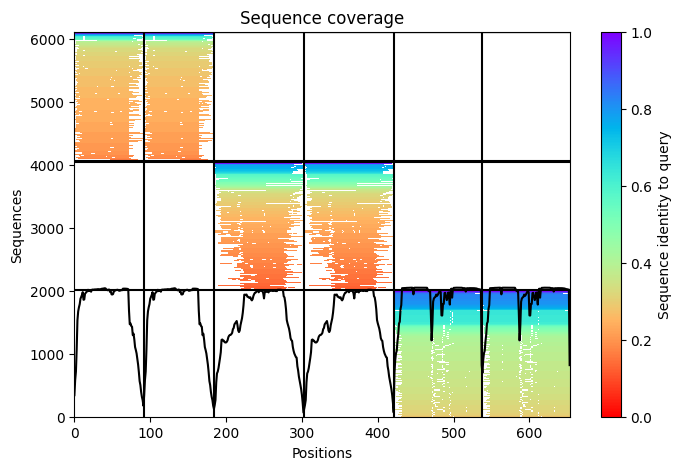

2024-11-06 21:29:10,334 Setting max_seq=508, max_extra_seq=2048
2024-11-06 21:29:57,543 alphafold2_multimer_v3_model_1_seed_000 recycle=0 pLDDT=80 pTM=0.802 ipTM=0.773
2024-11-06 21:29:57,545 alphafold2_multimer_v3_model_1_seed_000 took 42.8s (0 recycles)


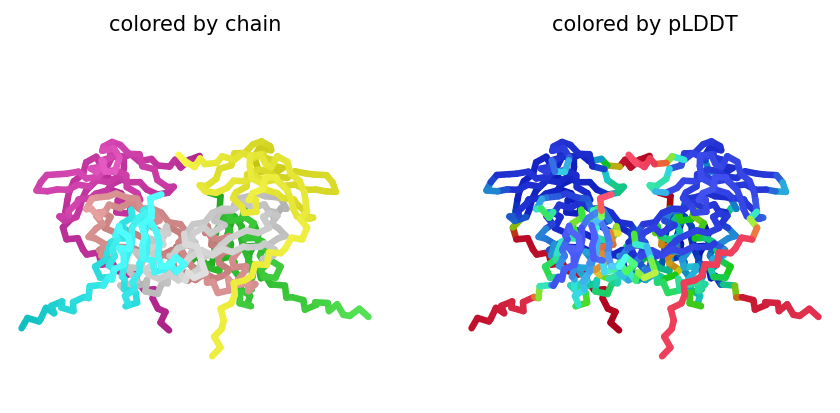

2024-11-06 21:30:09,378 alphafold2_multimer_v3_model_2_seed_000 recycle=0 pLDDT=75.6 pTM=0.712 ipTM=0.671
2024-11-06 21:30:09,379 alphafold2_multimer_v3_model_2_seed_000 took 11.1s (0 recycles)


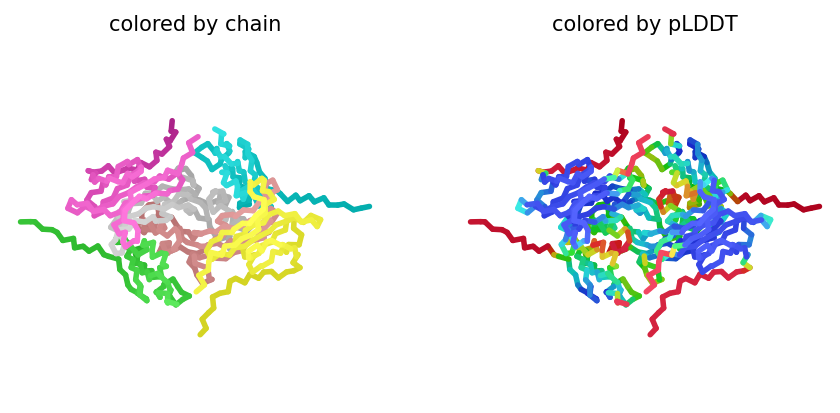

2024-11-06 21:30:21,235 alphafold2_multimer_v3_model_3_seed_000 recycle=0 pLDDT=65.7 pTM=0.67 ipTM=0.619
2024-11-06 21:30:21,236 alphafold2_multimer_v3_model_3_seed_000 took 11.1s (0 recycles)


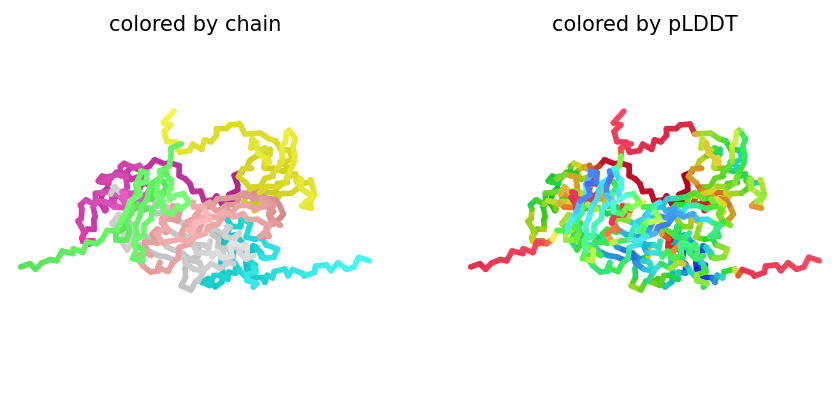

2024-11-06 21:30:33,125 alphafold2_multimer_v3_model_4_seed_000 recycle=0 pLDDT=78.3 pTM=0.758 ipTM=0.724
2024-11-06 21:30:33,127 alphafold2_multimer_v3_model_4_seed_000 took 11.1s (0 recycles)


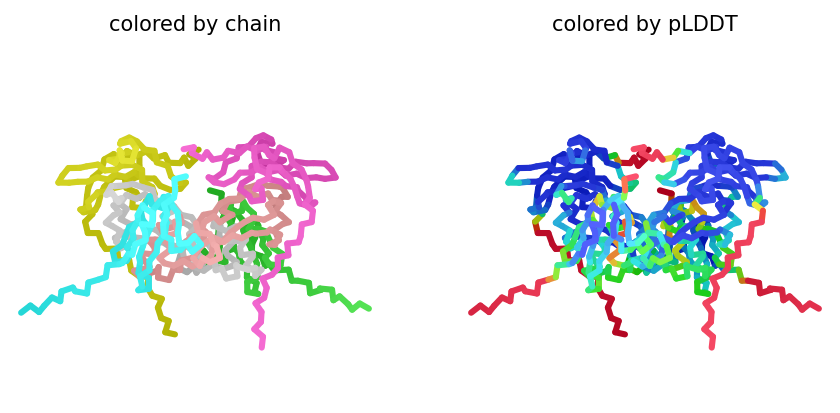

2024-11-06 21:30:45,019 alphafold2_multimer_v3_model_5_seed_000 recycle=0 pLDDT=64.7 pTM=0.726 ipTM=0.684
2024-11-06 21:30:45,020 alphafold2_multimer_v3_model_5_seed_000 took 11.1s (0 recycles)


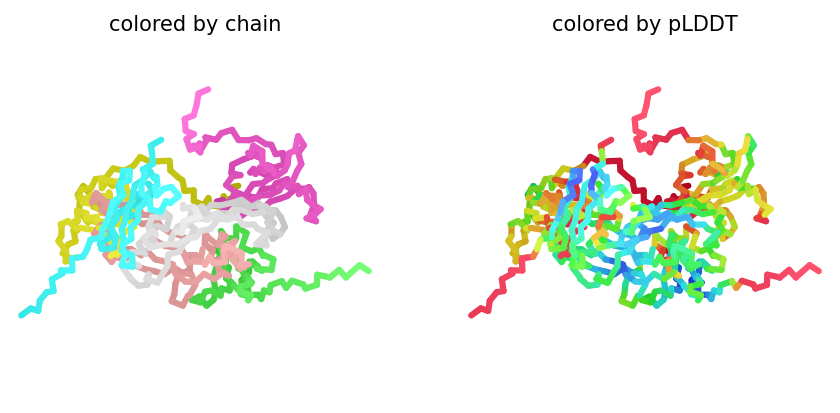

2024-11-06 21:30:56,873 alphafold2_multimer_v3_model_1_seed_001 recycle=0 pLDDT=63.2 pTM=0.691 ipTM=0.641
2024-11-06 21:30:56,875 alphafold2_multimer_v3_model_1_seed_001 took 11.1s (0 recycles)


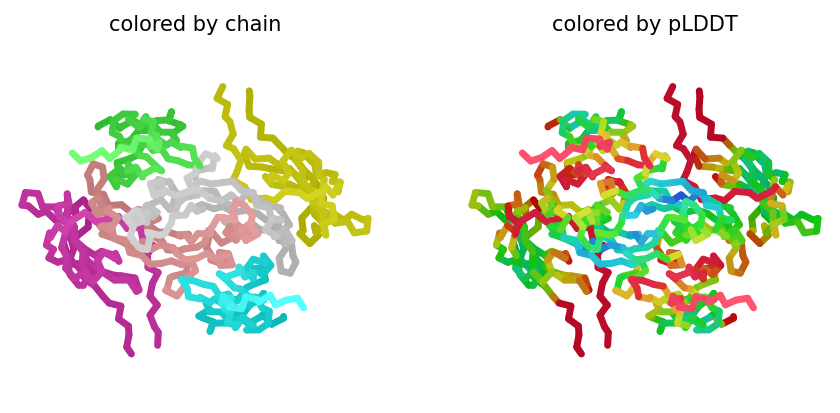

2024-11-06 21:31:08,760 alphafold2_multimer_v3_model_2_seed_001 recycle=0 pLDDT=69.9 pTM=0.734 ipTM=0.693
2024-11-06 21:31:08,762 alphafold2_multimer_v3_model_2_seed_001 took 11.1s (0 recycles)


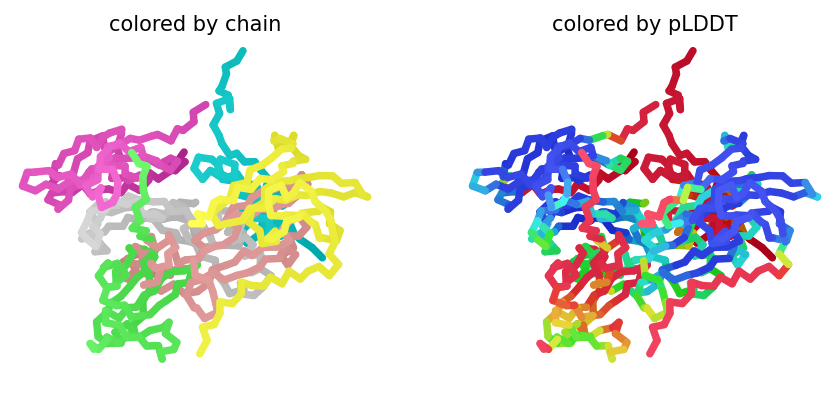

2024-11-06 21:31:20,608 alphafold2_multimer_v3_model_3_seed_001 recycle=0 pLDDT=59.5 pTM=0.728 ipTM=0.686
2024-11-06 21:31:20,610 alphafold2_multimer_v3_model_3_seed_001 took 11.1s (0 recycles)


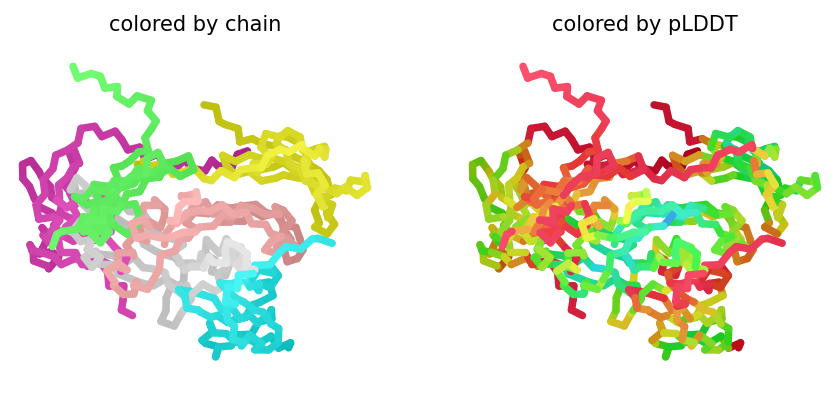

2024-11-06 21:31:32,484 alphafold2_multimer_v3_model_4_seed_001 recycle=0 pLDDT=78.4 pTM=0.764 ipTM=0.727
2024-11-06 21:31:32,486 alphafold2_multimer_v3_model_4_seed_001 took 11.1s (0 recycles)


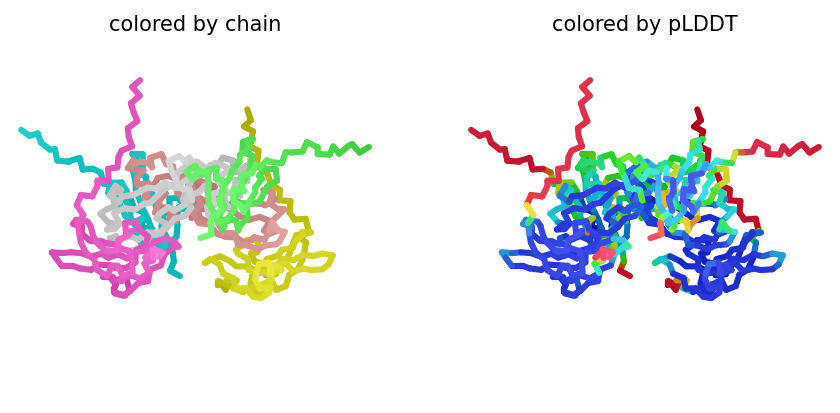

2024-11-06 21:31:44,353 alphafold2_multimer_v3_model_5_seed_001 recycle=0 pLDDT=67.9 pTM=0.758 ipTM=0.717
2024-11-06 21:31:44,355 alphafold2_multimer_v3_model_5_seed_001 took 11.1s (0 recycles)


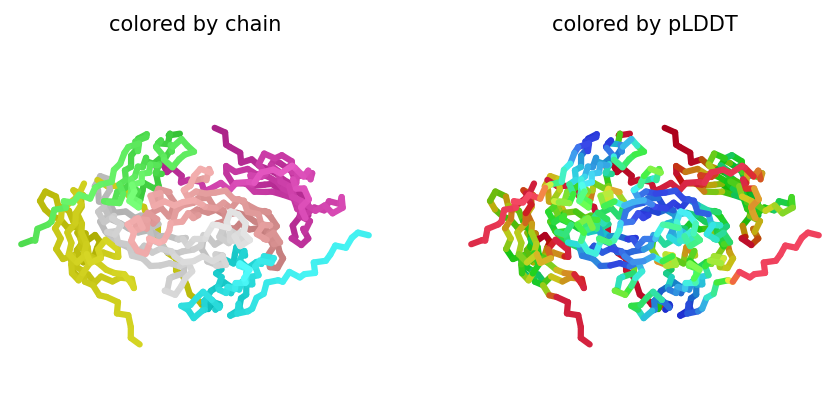

2024-11-06 21:31:56,205 alphafold2_multimer_v3_model_1_seed_002 recycle=0 pLDDT=66.8 pTM=0.765 ipTM=0.73
2024-11-06 21:31:56,207 alphafold2_multimer_v3_model_1_seed_002 took 11.1s (0 recycles)


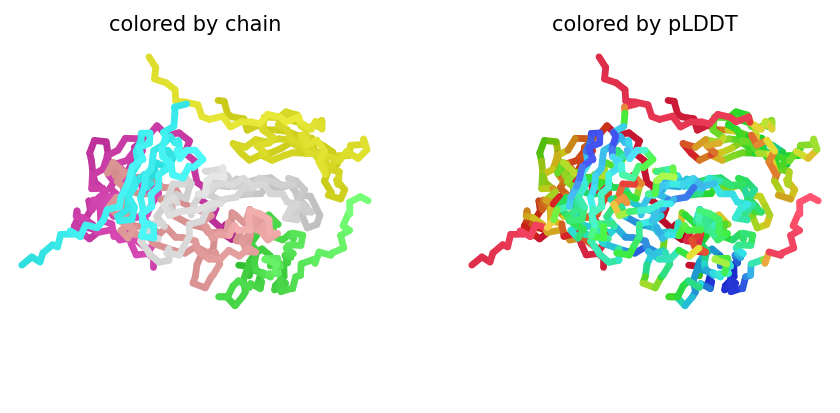

2024-11-06 21:32:08,057 alphafold2_multimer_v3_model_2_seed_002 recycle=0 pLDDT=79.4 pTM=0.781 ipTM=0.75
2024-11-06 21:32:08,059 alphafold2_multimer_v3_model_2_seed_002 took 11.1s (0 recycles)


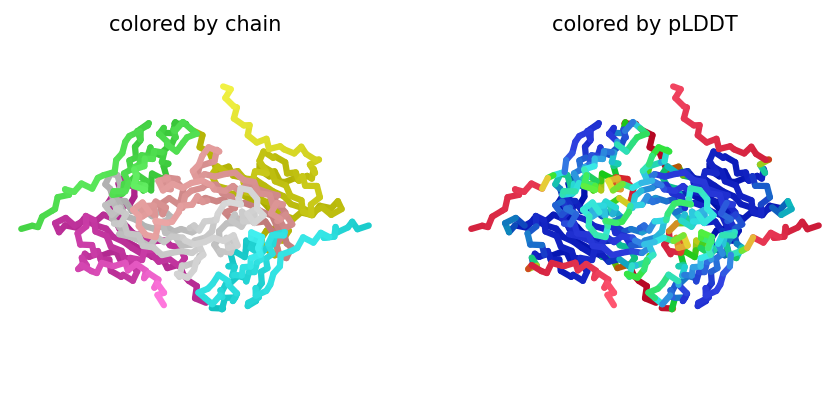

2024-11-06 21:32:19,878 alphafold2_multimer_v3_model_3_seed_002 recycle=0 pLDDT=64.9 pTM=0.705 ipTM=0.658
2024-11-06 21:32:19,880 alphafold2_multimer_v3_model_3_seed_002 took 11.1s (0 recycles)


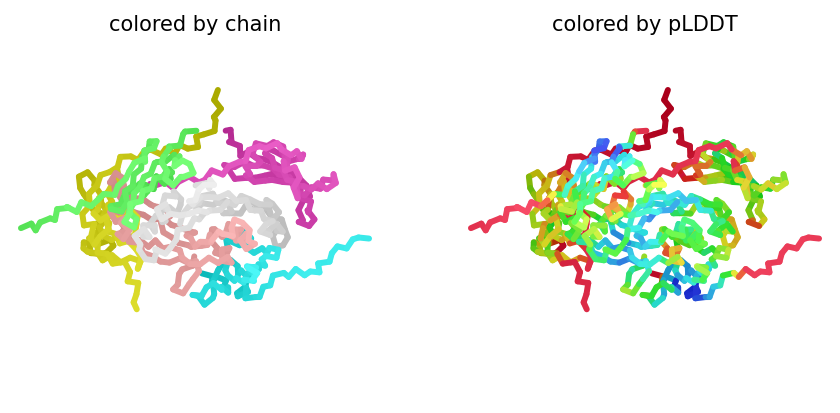

2024-11-06 21:32:31,742 alphafold2_multimer_v3_model_4_seed_002 recycle=0 pLDDT=78.6 pTM=0.753 ipTM=0.717
2024-11-06 21:32:31,744 alphafold2_multimer_v3_model_4_seed_002 took 11.1s (0 recycles)


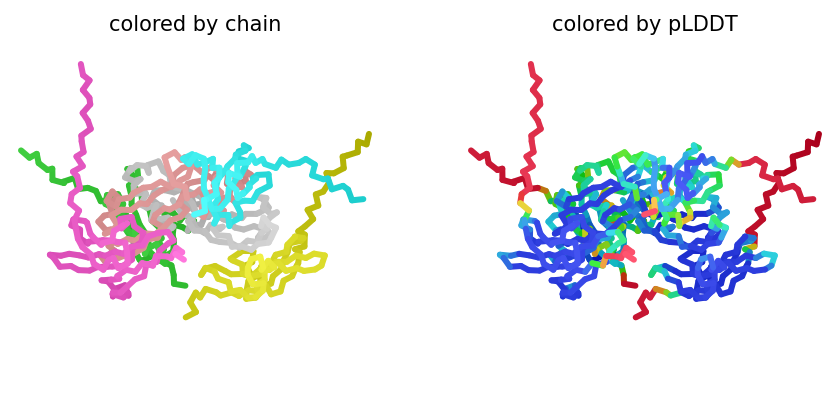

2024-11-06 21:32:43,609 alphafold2_multimer_v3_model_5_seed_002 recycle=0 pLDDT=66.6 pTM=0.752 ipTM=0.713
2024-11-06 21:32:43,611 alphafold2_multimer_v3_model_5_seed_002 took 11.1s (0 recycles)


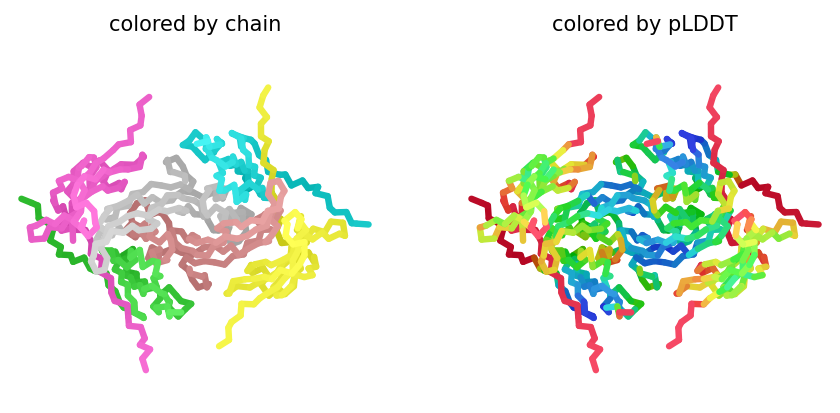

2024-11-06 21:32:55,531 alphafold2_multimer_v3_model_1_seed_003 recycle=0 pLDDT=81.4 pTM=0.817 ipTM=0.791
2024-11-06 21:32:55,532 alphafold2_multimer_v3_model_1_seed_003 took 11.1s (0 recycles)


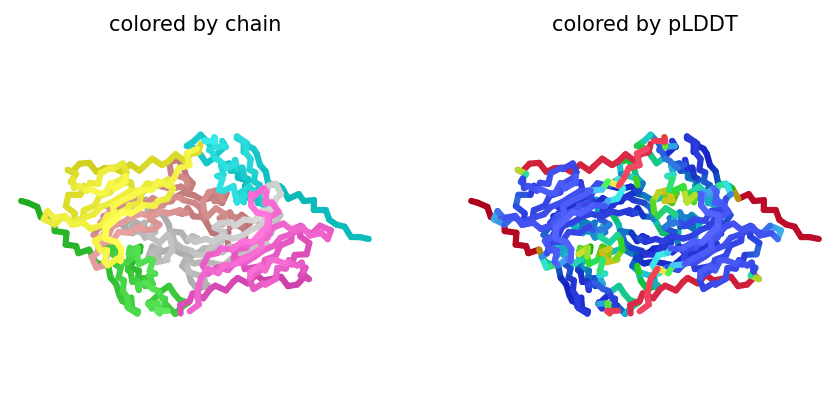

2024-11-06 21:33:07,366 alphafold2_multimer_v3_model_2_seed_003 recycle=0 pLDDT=71.2 pTM=0.657 ipTM=0.604
2024-11-06 21:33:07,368 alphafold2_multimer_v3_model_2_seed_003 took 11.1s (0 recycles)


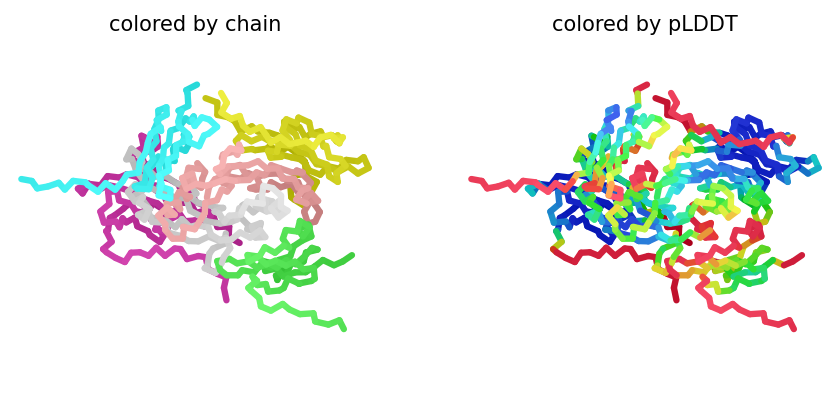

2024-11-06 21:33:19,199 alphafold2_multimer_v3_model_3_seed_003 recycle=0 pLDDT=58.7 pTM=0.627 ipTM=0.566
2024-11-06 21:33:19,201 alphafold2_multimer_v3_model_3_seed_003 took 11.1s (0 recycles)


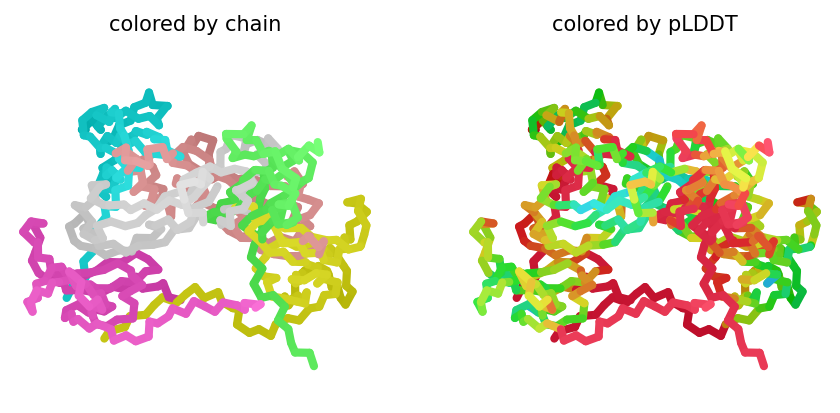

2024-11-06 21:33:31,087 alphafold2_multimer_v3_model_4_seed_003 recycle=0 pLDDT=68.1 pTM=0.747 ipTM=0.708
2024-11-06 21:33:31,088 alphafold2_multimer_v3_model_4_seed_003 took 11.1s (0 recycles)


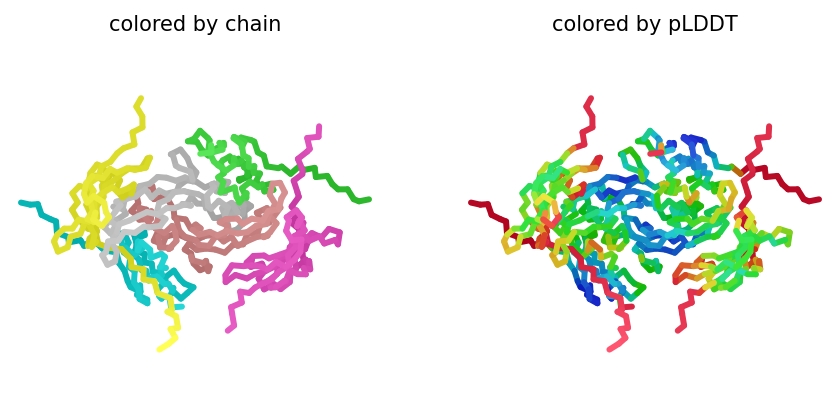

2024-11-06 21:33:42,923 alphafold2_multimer_v3_model_5_seed_003 recycle=0 pLDDT=66.9 pTM=0.746 ipTM=0.706
2024-11-06 21:33:42,925 alphafold2_multimer_v3_model_5_seed_003 took 11.1s (0 recycles)


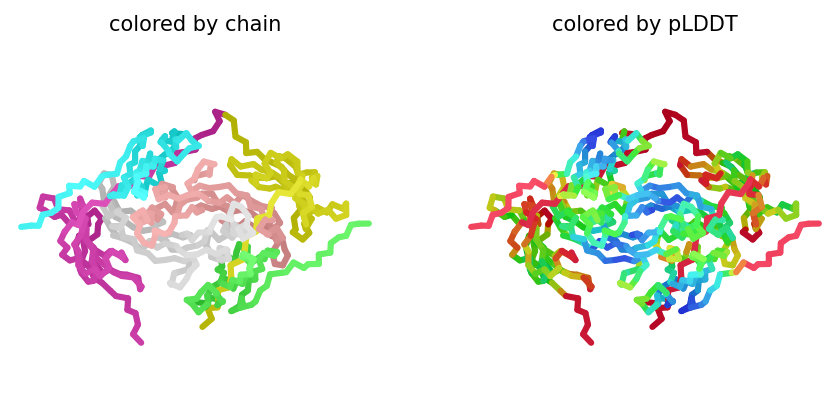

2024-11-06 21:33:54,784 alphafold2_multimer_v3_model_1_seed_004 recycle=0 pLDDT=67 pTM=0.768 ipTM=0.733
2024-11-06 21:33:54,785 alphafold2_multimer_v3_model_1_seed_004 took 11.1s (0 recycles)


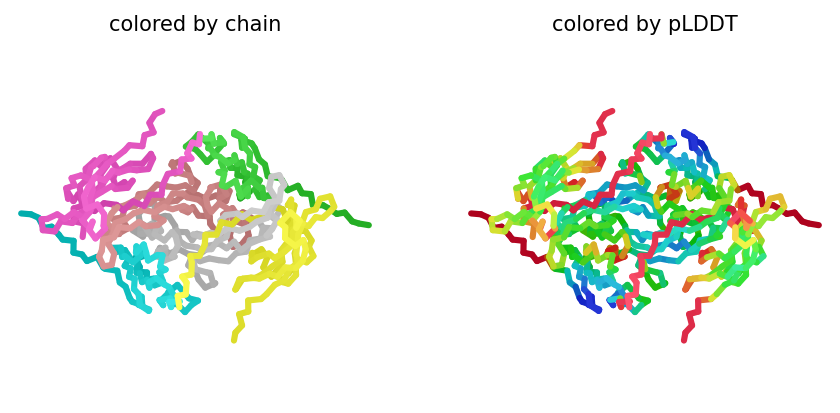

2024-11-06 21:34:06,647 alphafold2_multimer_v3_model_2_seed_004 recycle=0 pLDDT=64.2 pTM=0.747 ipTM=0.709
2024-11-06 21:34:06,649 alphafold2_multimer_v3_model_2_seed_004 took 11.1s (0 recycles)


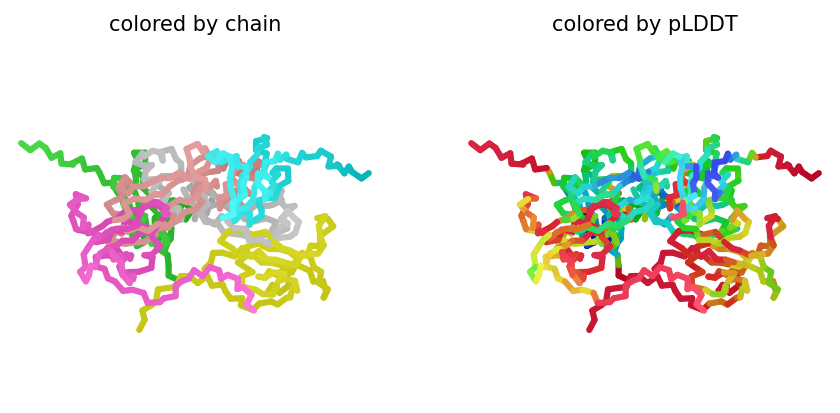

2024-11-06 21:34:18,497 alphafold2_multimer_v3_model_3_seed_004 recycle=0 pLDDT=64.6 pTM=0.691 ipTM=0.642
2024-11-06 21:34:18,499 alphafold2_multimer_v3_model_3_seed_004 took 11.1s (0 recycles)


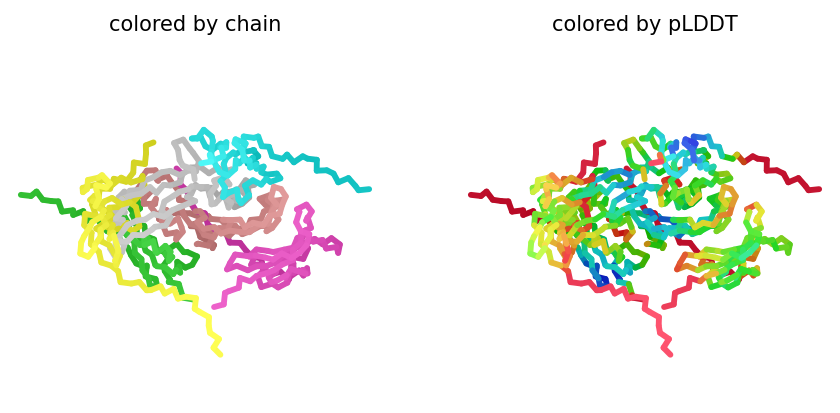

2024-11-06 21:34:30,360 alphafold2_multimer_v3_model_4_seed_004 recycle=0 pLDDT=78.9 pTM=0.767 ipTM=0.732
2024-11-06 21:34:30,362 alphafold2_multimer_v3_model_4_seed_004 took 11.1s (0 recycles)


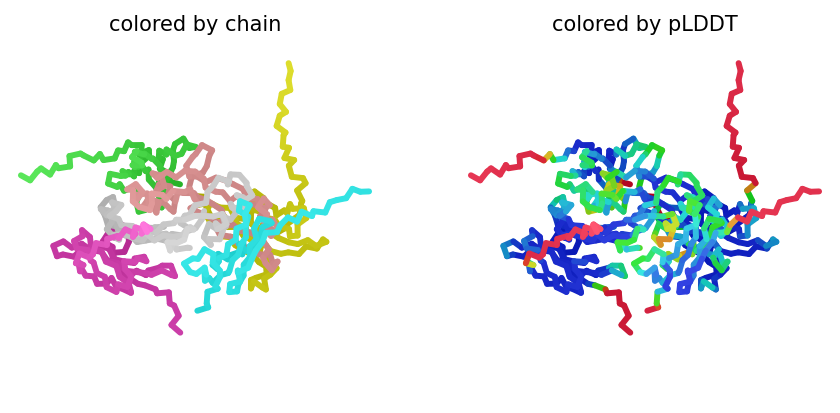

2024-11-06 21:34:42,209 alphafold2_multimer_v3_model_5_seed_004 recycle=0 pLDDT=65.8 pTM=0.734 ipTM=0.691
2024-11-06 21:34:42,210 alphafold2_multimer_v3_model_5_seed_004 took 11.1s (0 recycles)


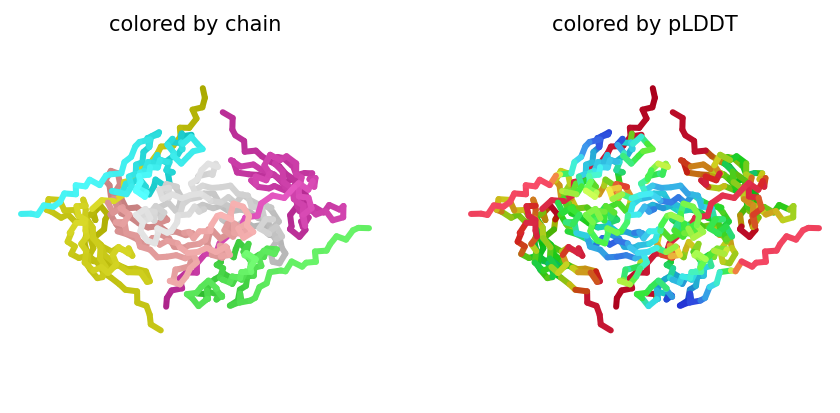

2024-11-06 21:34:54,104 alphafold2_multimer_v3_model_1_seed_005 recycle=0 pLDDT=65.4 pTM=0.753 ipTM=0.717
2024-11-06 21:34:54,106 alphafold2_multimer_v3_model_1_seed_005 took 11.1s (0 recycles)


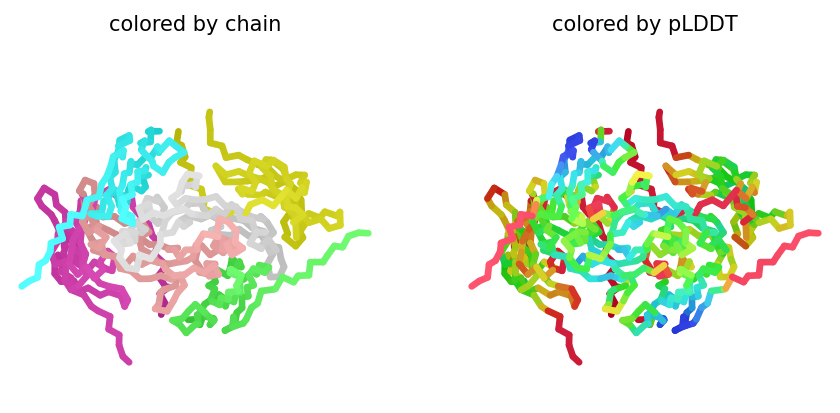

2024-11-06 21:35:05,992 alphafold2_multimer_v3_model_2_seed_005 recycle=0 pLDDT=59.1 pTM=0.594 ipTM=0.527
2024-11-06 21:35:05,994 alphafold2_multimer_v3_model_2_seed_005 took 11.1s (0 recycles)


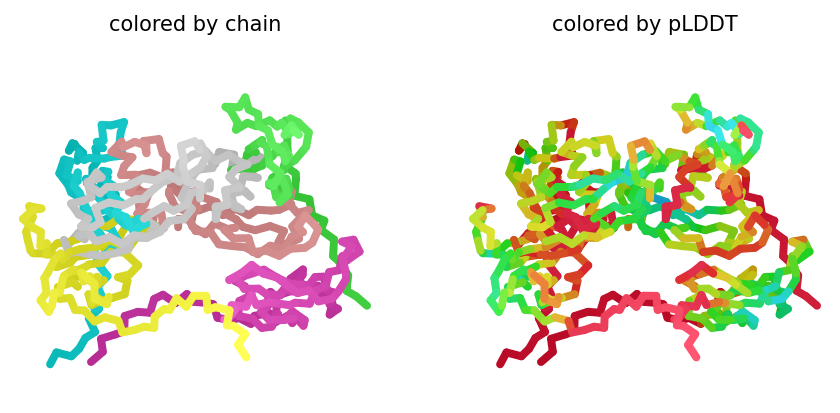

2024-11-06 21:35:17,841 alphafold2_multimer_v3_model_3_seed_005 recycle=0 pLDDT=65.2 pTM=0.727 ipTM=0.686
2024-11-06 21:35:17,842 alphafold2_multimer_v3_model_3_seed_005 took 11.1s (0 recycles)


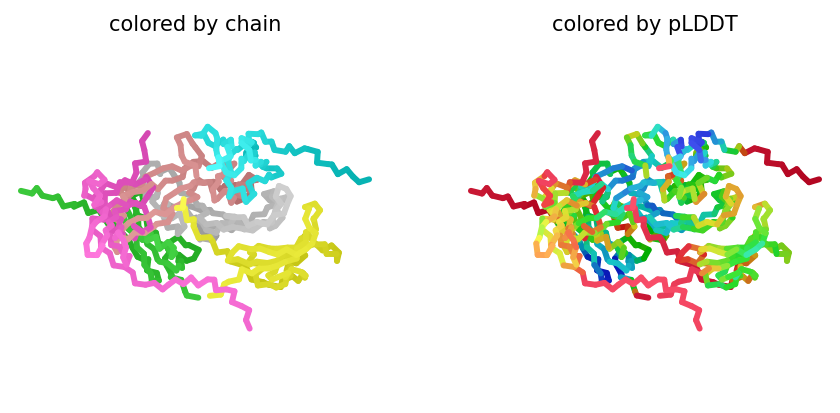

2024-11-06 21:35:29,715 alphafold2_multimer_v3_model_4_seed_005 recycle=0 pLDDT=67 pTM=0.733 ipTM=0.692
2024-11-06 21:35:29,717 alphafold2_multimer_v3_model_4_seed_005 took 11.1s (0 recycles)


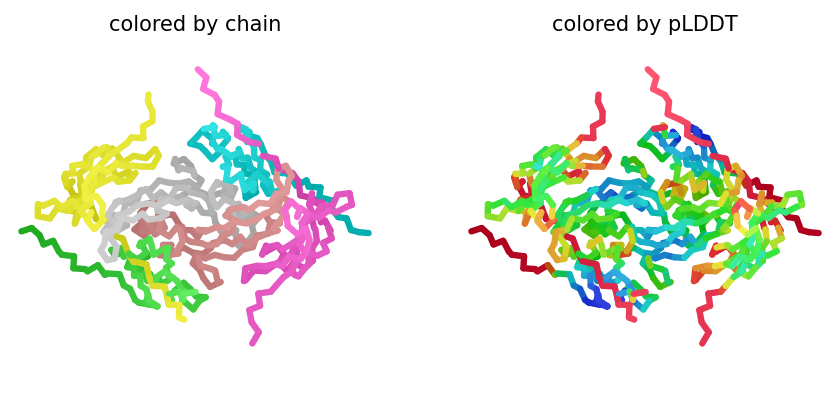

2024-11-06 21:35:41,609 alphafold2_multimer_v3_model_5_seed_005 recycle=0 pLDDT=65.8 pTM=0.775 ipTM=0.74
2024-11-06 21:35:41,610 alphafold2_multimer_v3_model_5_seed_005 took 11.1s (0 recycles)


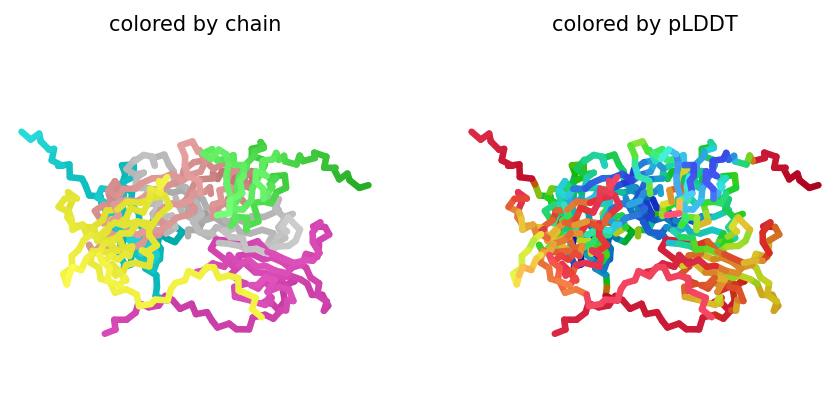

2024-11-06 21:35:53,464 alphafold2_multimer_v3_model_1_seed_006 recycle=0 pLDDT=78.6 pTM=0.781 ipTM=0.75
2024-11-06 21:35:53,466 alphafold2_multimer_v3_model_1_seed_006 took 11.1s (0 recycles)


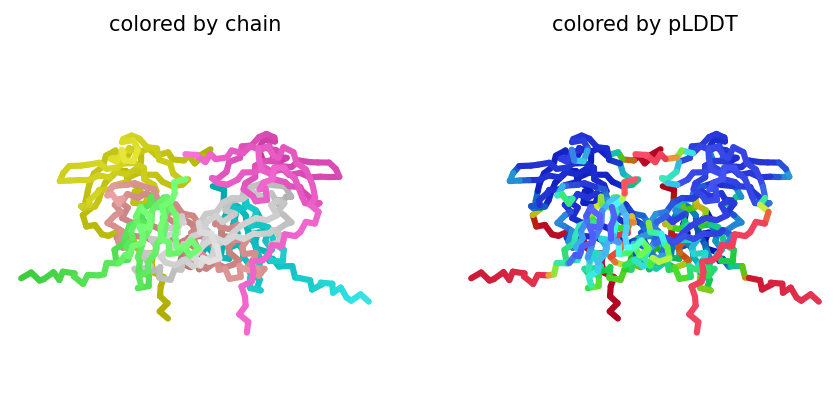

2024-11-06 21:36:05,316 alphafold2_multimer_v3_model_2_seed_006 recycle=0 pLDDT=76.9 pTM=0.735 ipTM=0.698
2024-11-06 21:36:05,317 alphafold2_multimer_v3_model_2_seed_006 took 11.1s (0 recycles)


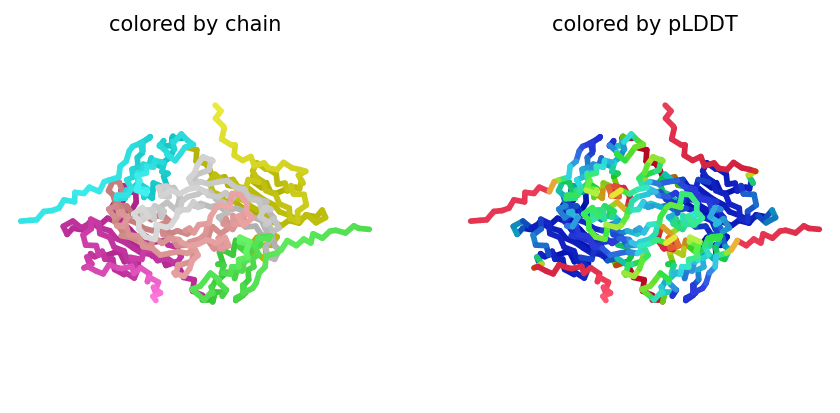

2024-11-06 21:36:17,176 alphafold2_multimer_v3_model_3_seed_006 recycle=0 pLDDT=62.6 pTM=0.616 ipTM=0.552
2024-11-06 21:36:17,178 alphafold2_multimer_v3_model_3_seed_006 took 11.1s (0 recycles)


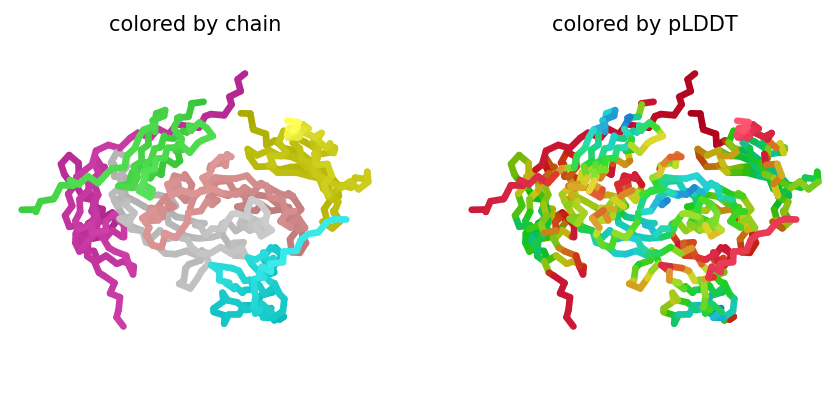

2024-11-06 21:36:29,046 alphafold2_multimer_v3_model_4_seed_006 recycle=0 pLDDT=77.2 pTM=0.744 ipTM=0.707
2024-11-06 21:36:29,048 alphafold2_multimer_v3_model_4_seed_006 took 11.1s (0 recycles)


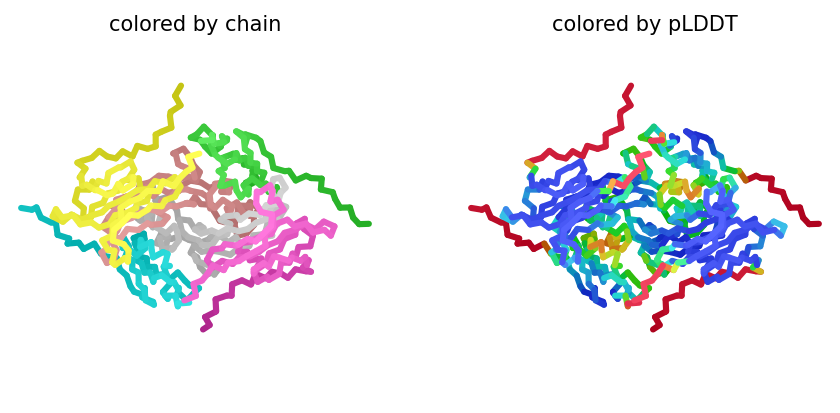

2024-11-06 21:36:40,914 alphafold2_multimer_v3_model_5_seed_006 recycle=0 pLDDT=65.8 pTM=0.735 ipTM=0.693
2024-11-06 21:36:40,916 alphafold2_multimer_v3_model_5_seed_006 took 11.1s (0 recycles)


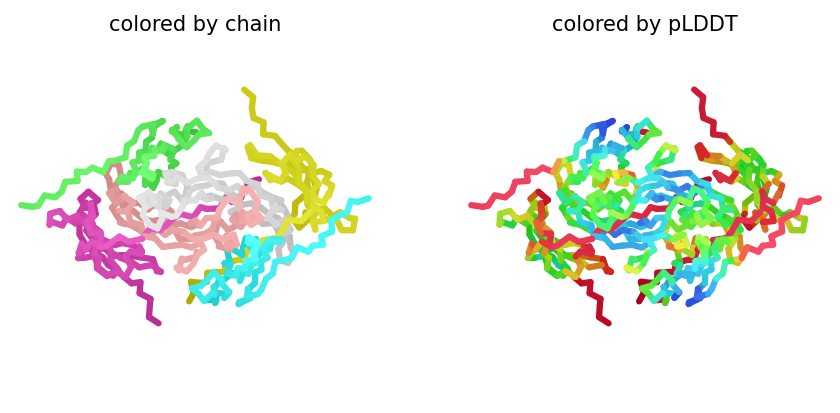

2024-11-06 21:36:52,754 alphafold2_multimer_v3_model_1_seed_007 recycle=0 pLDDT=68.1 pTM=0.75 ipTM=0.713
2024-11-06 21:36:52,756 alphafold2_multimer_v3_model_1_seed_007 took 11.1s (0 recycles)


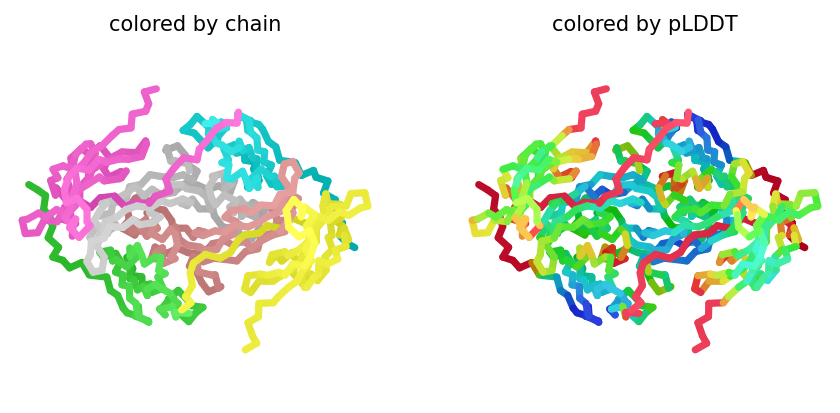

2024-11-06 21:37:04,622 alphafold2_multimer_v3_model_2_seed_007 recycle=0 pLDDT=65.4 pTM=0.641 ipTM=0.584
2024-11-06 21:37:04,623 alphafold2_multimer_v3_model_2_seed_007 took 11.1s (0 recycles)


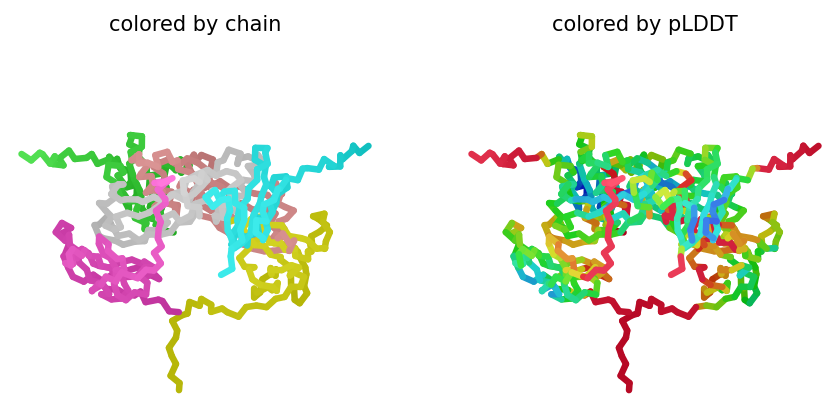

2024-11-06 21:37:16,478 alphafold2_multimer_v3_model_3_seed_007 recycle=0 pLDDT=64.2 pTM=0.632 ipTM=0.572
2024-11-06 21:37:16,480 alphafold2_multimer_v3_model_3_seed_007 took 11.1s (0 recycles)


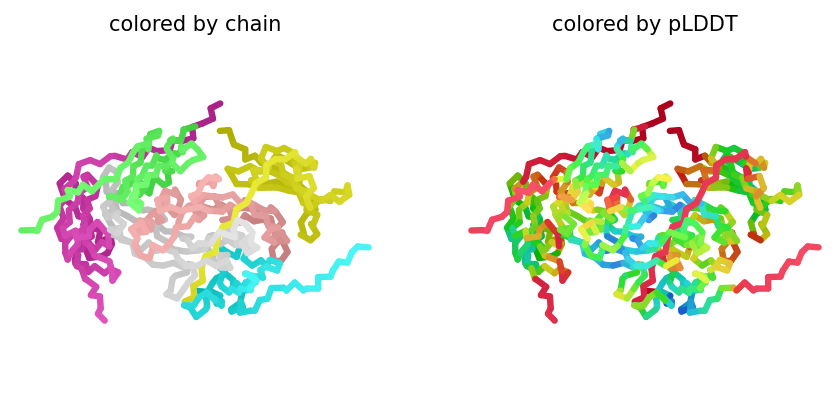

2024-11-06 21:37:28,335 alphafold2_multimer_v3_model_4_seed_007 recycle=0 pLDDT=78.6 pTM=0.754 ipTM=0.72
2024-11-06 21:37:28,337 alphafold2_multimer_v3_model_4_seed_007 took 11.1s (0 recycles)


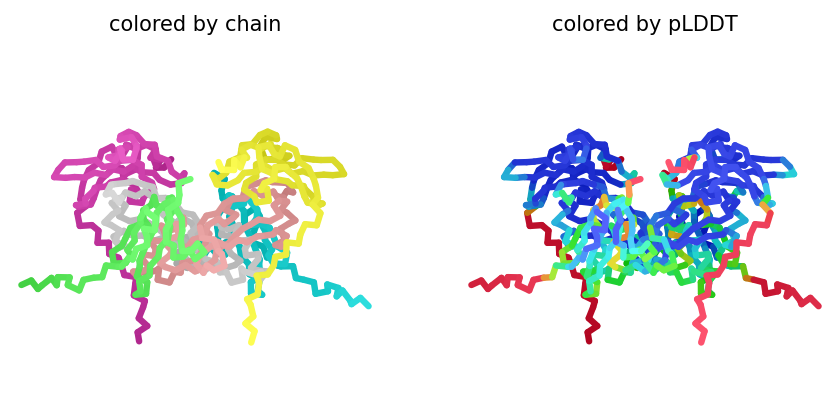

2024-11-06 21:37:40,184 alphafold2_multimer_v3_model_5_seed_007 recycle=0 pLDDT=65.5 pTM=0.735 ipTM=0.693
2024-11-06 21:37:40,186 alphafold2_multimer_v3_model_5_seed_007 took 11.1s (0 recycles)


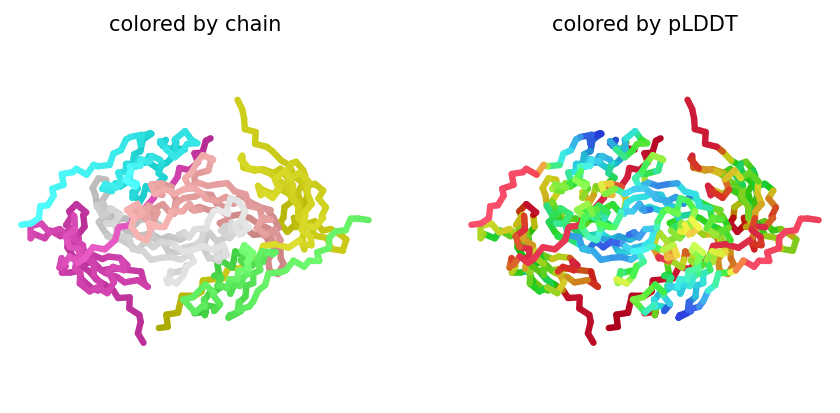

2024-11-06 21:37:52,034 alphafold2_multimer_v3_model_1_seed_008 recycle=0 pLDDT=70.4 pTM=0.726 ipTM=0.681
2024-11-06 21:37:52,036 alphafold2_multimer_v3_model_1_seed_008 took 11.1s (0 recycles)


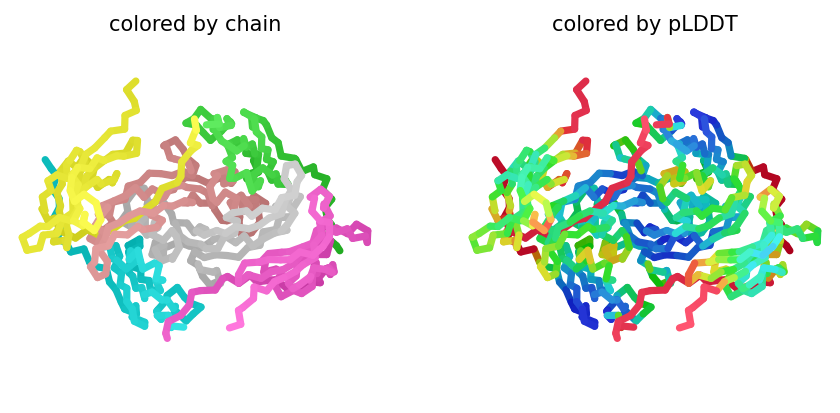

2024-11-06 21:38:04,709 alphafold2_multimer_v3_model_2_seed_008 recycle=0 pLDDT=64.9 pTM=0.681 ipTM=0.633
2024-11-06 21:38:04,711 alphafold2_multimer_v3_model_2_seed_008 took 11.1s (0 recycles)


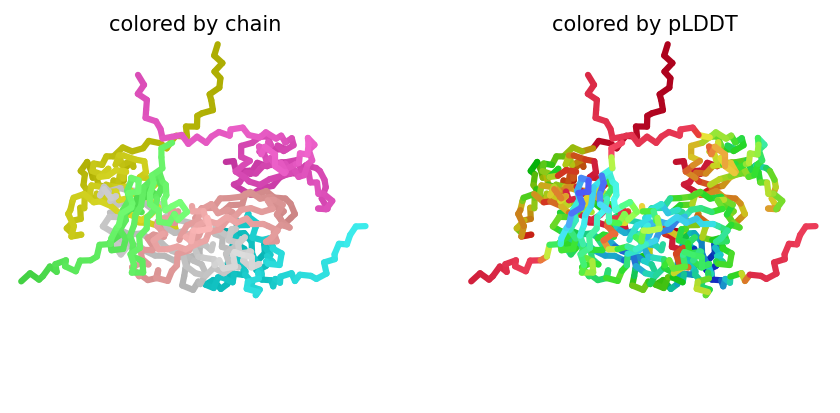

2024-11-06 21:38:16,614 alphafold2_multimer_v3_model_3_seed_008 recycle=0 pLDDT=67.9 pTM=0.691 ipTM=0.64
2024-11-06 21:38:16,616 alphafold2_multimer_v3_model_3_seed_008 took 11.1s (0 recycles)


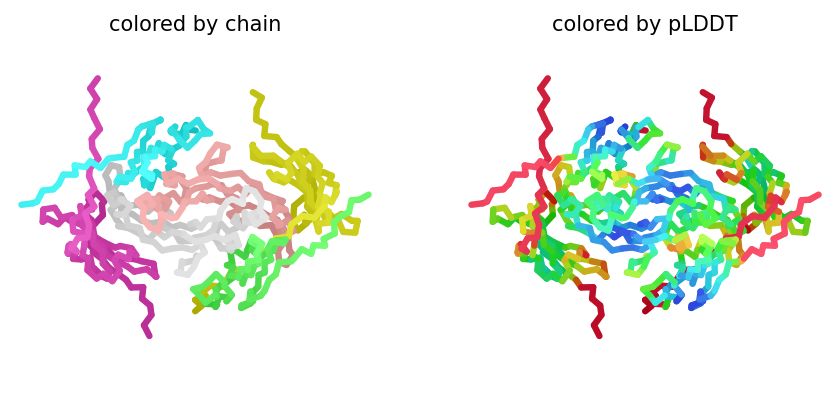

2024-11-06 21:38:28,507 alphafold2_multimer_v3_model_4_seed_008 recycle=0 pLDDT=80.6 pTM=0.794 ipTM=0.763
2024-11-06 21:38:28,508 alphafold2_multimer_v3_model_4_seed_008 took 11.1s (0 recycles)


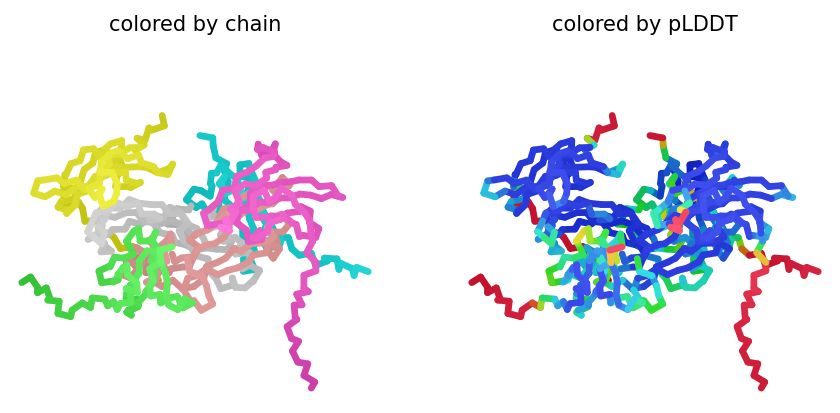

2024-11-06 21:38:40,423 alphafold2_multimer_v3_model_5_seed_008 recycle=0 pLDDT=67.2 pTM=0.749 ipTM=0.708
2024-11-06 21:38:40,425 alphafold2_multimer_v3_model_5_seed_008 took 11.1s (0 recycles)


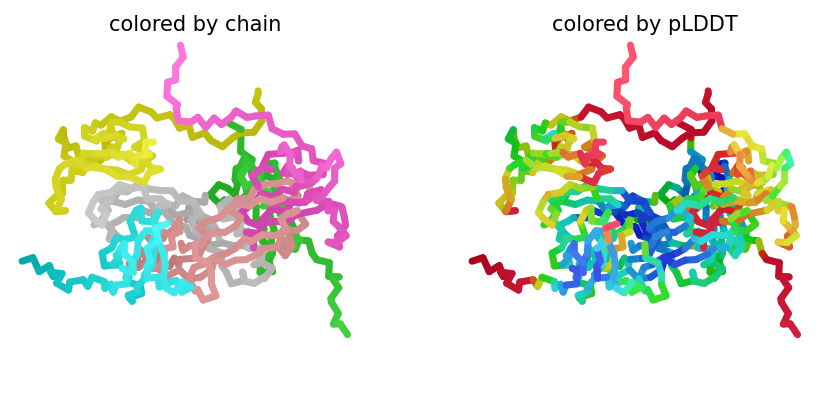

2024-11-06 21:38:52,301 alphafold2_multimer_v3_model_1_seed_009 recycle=0 pLDDT=78.8 pTM=0.783 ipTM=0.751
2024-11-06 21:38:52,303 alphafold2_multimer_v3_model_1_seed_009 took 11.1s (0 recycles)


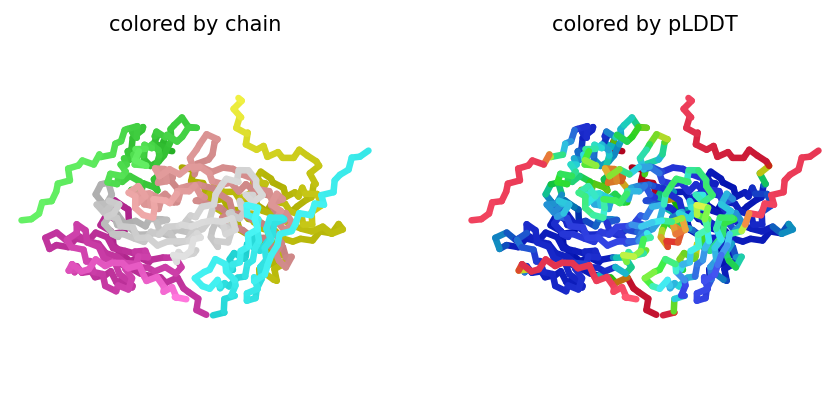

2024-11-06 21:39:04,142 alphafold2_multimer_v3_model_2_seed_009 recycle=0 pLDDT=74.8 pTM=0.695 ipTM=0.651
2024-11-06 21:39:04,143 alphafold2_multimer_v3_model_2_seed_009 took 11.1s (0 recycles)


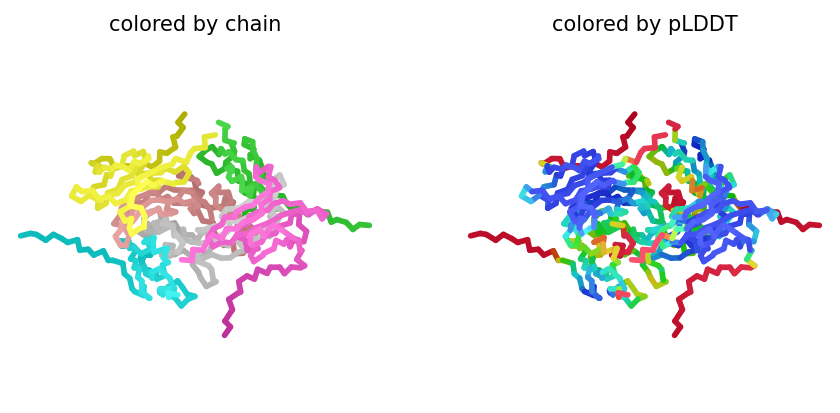

2024-11-06 21:39:15,969 alphafold2_multimer_v3_model_3_seed_009 recycle=0 pLDDT=60.3 pTM=0.601 ipTM=0.533
2024-11-06 21:39:15,970 alphafold2_multimer_v3_model_3_seed_009 took 11.0s (0 recycles)


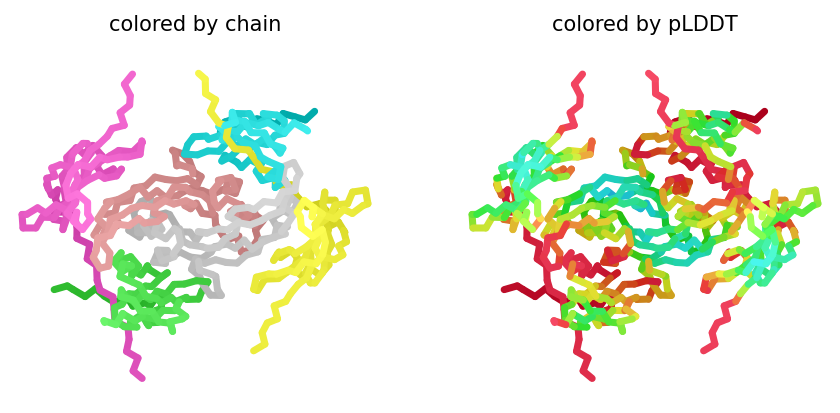

2024-11-06 21:39:27,833 alphafold2_multimer_v3_model_4_seed_009 recycle=0 pLDDT=79.5 pTM=0.773 ipTM=0.742
2024-11-06 21:39:27,835 alphafold2_multimer_v3_model_4_seed_009 took 11.1s (0 recycles)


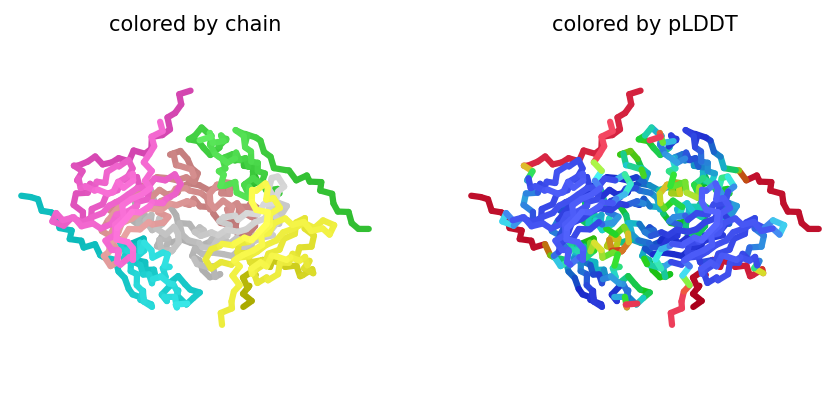

2024-11-06 21:39:39,683 alphafold2_multimer_v3_model_5_seed_009 recycle=0 pLDDT=77.4 pTM=0.779 ipTM=0.746
2024-11-06 21:39:39,685 alphafold2_multimer_v3_model_5_seed_009 took 11.1s (0 recycles)


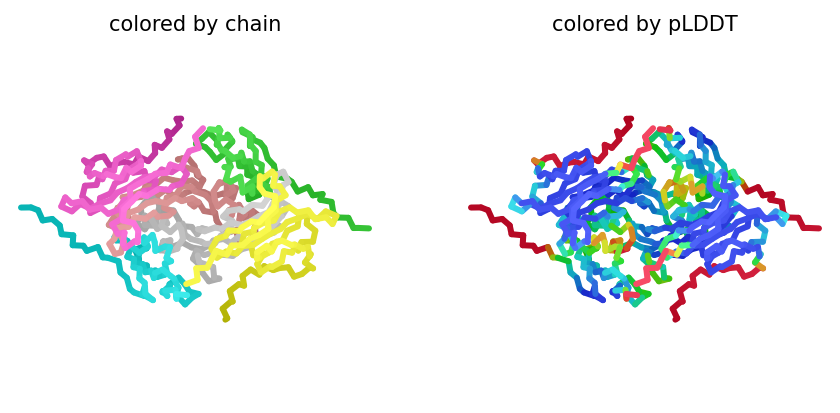

2024-11-06 21:39:51,569 alphafold2_multimer_v3_model_1_seed_010 recycle=0 pLDDT=79.4 pTM=0.792 ipTM=0.761
2024-11-06 21:39:51,571 alphafold2_multimer_v3_model_1_seed_010 took 11.1s (0 recycles)


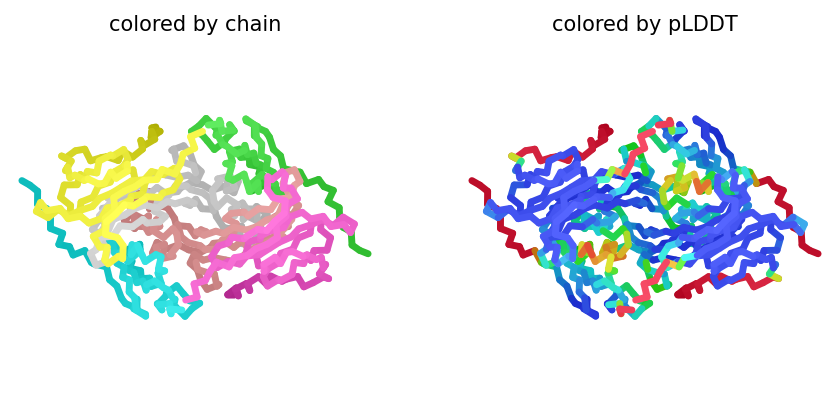

2024-11-06 21:40:03,420 alphafold2_multimer_v3_model_2_seed_010 recycle=0 pLDDT=69.5 pTM=0.688 ipTM=0.64
2024-11-06 21:40:03,421 alphafold2_multimer_v3_model_2_seed_010 took 11.1s (0 recycles)


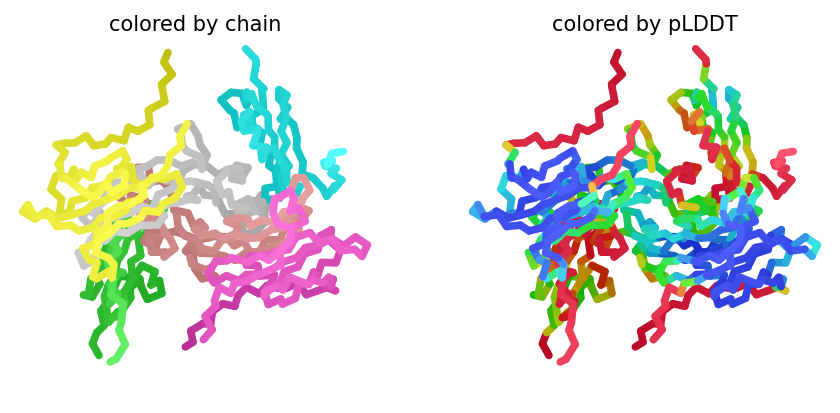

2024-11-06 21:40:15,261 alphafold2_multimer_v3_model_3_seed_010 recycle=0 pLDDT=58.7 pTM=0.619 ipTM=0.557
2024-11-06 21:40:15,262 alphafold2_multimer_v3_model_3_seed_010 took 11.0s (0 recycles)


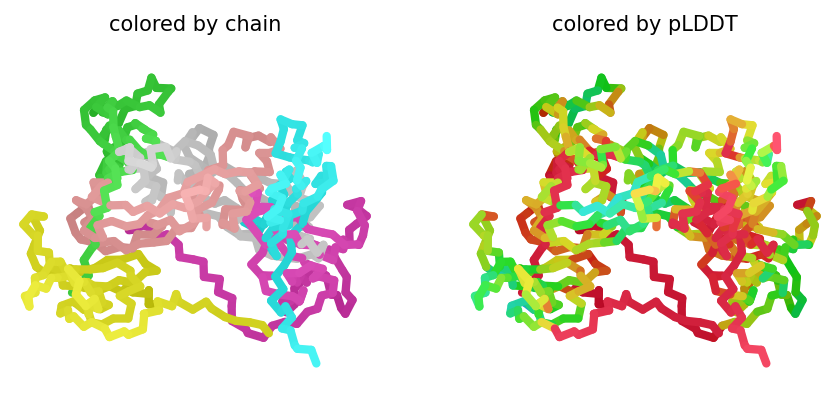

2024-11-06 21:40:27,171 alphafold2_multimer_v3_model_4_seed_010 recycle=0 pLDDT=67.6 pTM=0.752 ipTM=0.715
2024-11-06 21:40:27,173 alphafold2_multimer_v3_model_4_seed_010 took 11.1s (0 recycles)


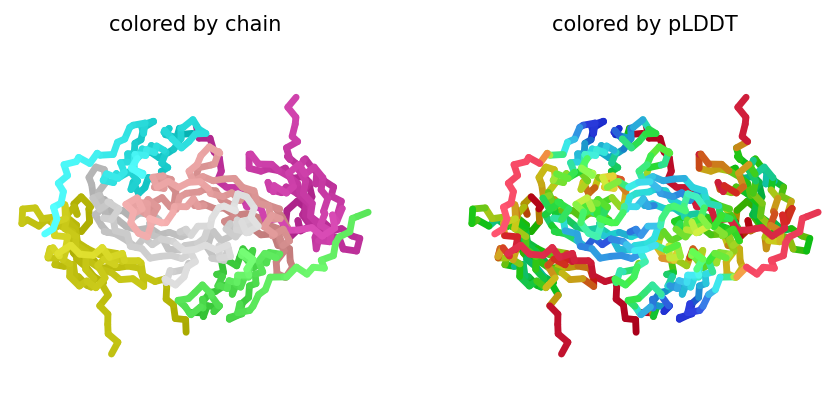

2024-11-06 21:40:39,032 alphafold2_multimer_v3_model_5_seed_010 recycle=0 pLDDT=64.2 pTM=0.75 ipTM=0.712
2024-11-06 21:40:39,034 alphafold2_multimer_v3_model_5_seed_010 took 11.1s (0 recycles)


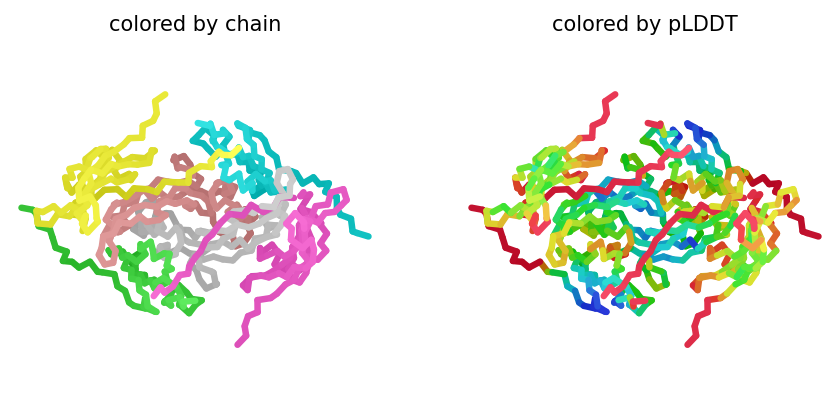

2024-11-06 21:40:50,912 alphafold2_multimer_v3_model_1_seed_011 recycle=0 pLDDT=78.9 pTM=0.793 ipTM=0.764
2024-11-06 21:40:50,914 alphafold2_multimer_v3_model_1_seed_011 took 11.1s (0 recycles)


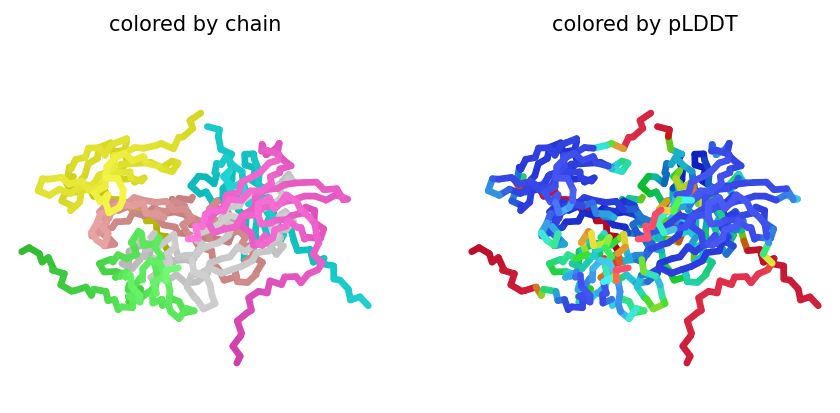

2024-11-06 21:41:02,786 alphafold2_multimer_v3_model_2_seed_011 recycle=0 pLDDT=79.5 pTM=0.787 ipTM=0.757
2024-11-06 21:41:02,787 alphafold2_multimer_v3_model_2_seed_011 took 11.1s (0 recycles)


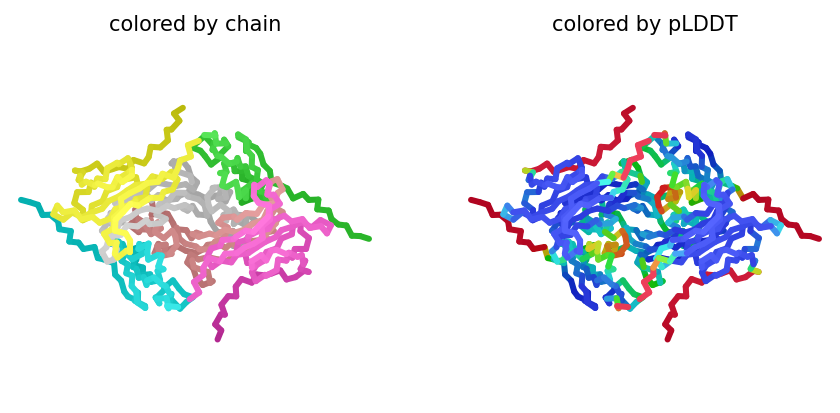

2024-11-06 21:41:14,607 alphafold2_multimer_v3_model_3_seed_011 recycle=0 pLDDT=65.9 pTM=0.715 ipTM=0.67
2024-11-06 21:41:14,609 alphafold2_multimer_v3_model_3_seed_011 took 11.1s (0 recycles)


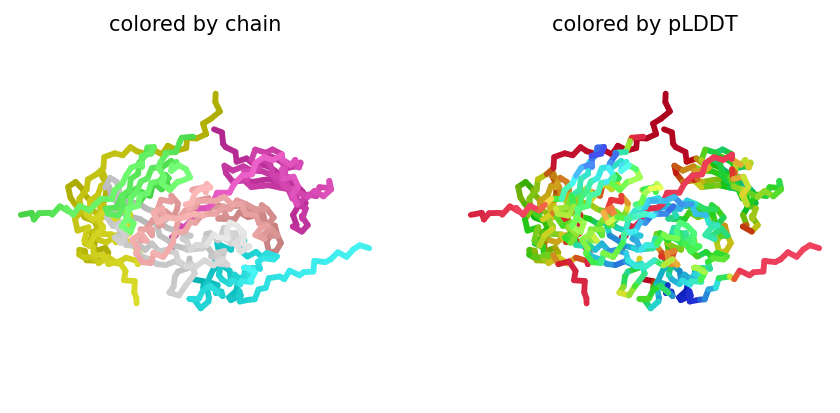

2024-11-06 21:41:26,454 alphafold2_multimer_v3_model_4_seed_011 recycle=0 pLDDT=79.1 pTM=0.778 ipTM=0.746
2024-11-06 21:41:26,455 alphafold2_multimer_v3_model_4_seed_011 took 11.1s (0 recycles)


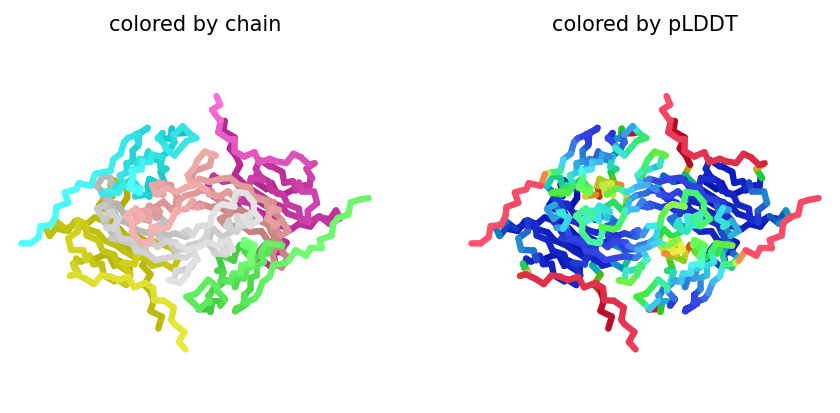

2024-11-06 21:41:38,302 alphafold2_multimer_v3_model_5_seed_011 recycle=0 pLDDT=67.4 pTM=0.766 ipTM=0.729
2024-11-06 21:41:38,304 alphafold2_multimer_v3_model_5_seed_011 took 11.1s (0 recycles)


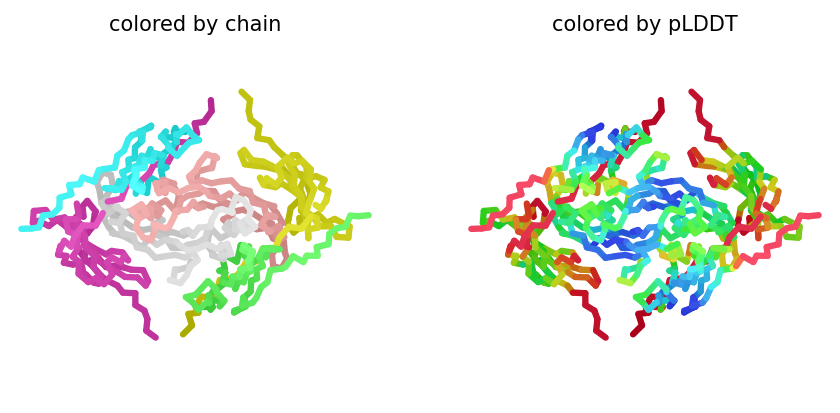

2024-11-06 21:41:50,213 alphafold2_multimer_v3_model_1_seed_012 recycle=0 pLDDT=79.2 pTM=0.792 ipTM=0.762
2024-11-06 21:41:50,215 alphafold2_multimer_v3_model_1_seed_012 took 11.1s (0 recycles)


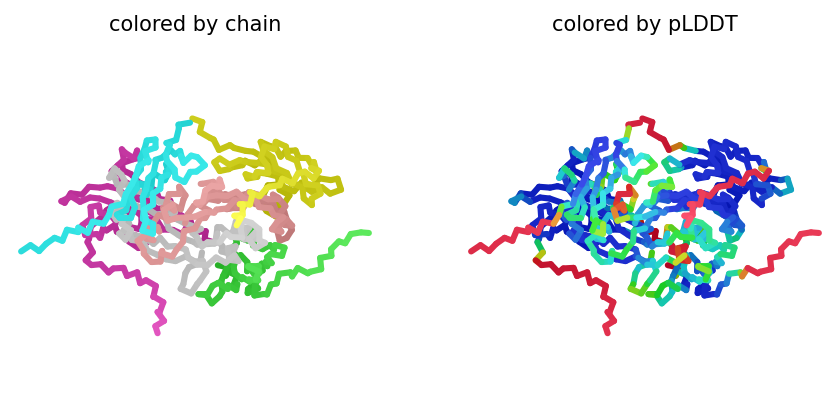

2024-11-06 21:42:02,045 alphafold2_multimer_v3_model_2_seed_012 recycle=0 pLDDT=69.9 pTM=0.683 ipTM=0.632
2024-11-06 21:42:02,046 alphafold2_multimer_v3_model_2_seed_012 took 11.1s (0 recycles)


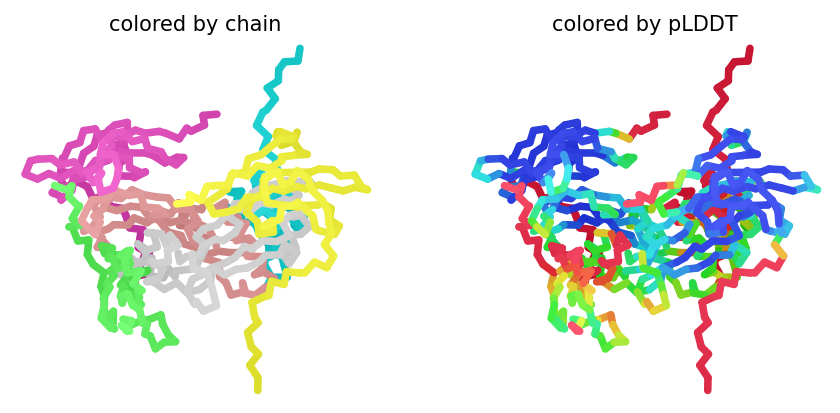

2024-11-06 21:42:13,864 alphafold2_multimer_v3_model_3_seed_012 recycle=0 pLDDT=57.8 pTM=0.686 ipTM=0.638
2024-11-06 21:42:13,866 alphafold2_multimer_v3_model_3_seed_012 took 11.1s (0 recycles)


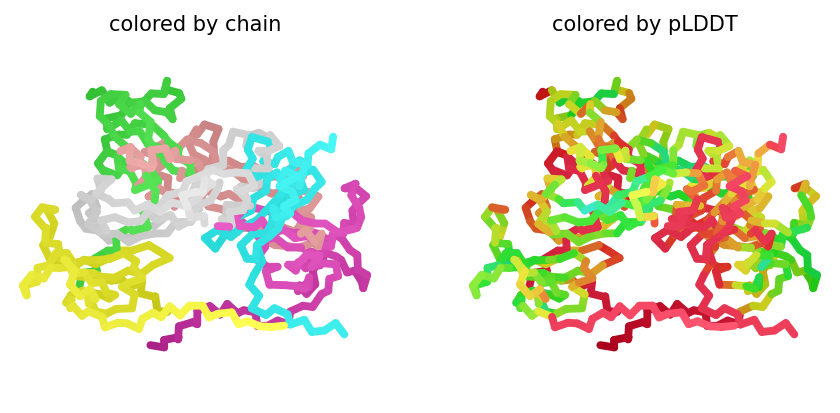

2024-11-06 21:42:25,731 alphafold2_multimer_v3_model_4_seed_012 recycle=0 pLDDT=68.1 pTM=0.738 ipTM=0.699
2024-11-06 21:42:25,733 alphafold2_multimer_v3_model_4_seed_012 took 11.1s (0 recycles)


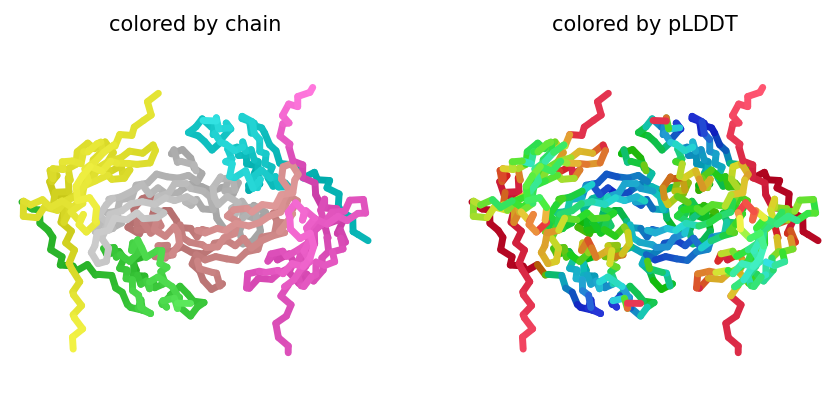

2024-11-06 21:42:37,640 alphafold2_multimer_v3_model_5_seed_012 recycle=0 pLDDT=66.8 pTM=0.75 ipTM=0.712
2024-11-06 21:42:37,642 alphafold2_multimer_v3_model_5_seed_012 took 11.1s (0 recycles)


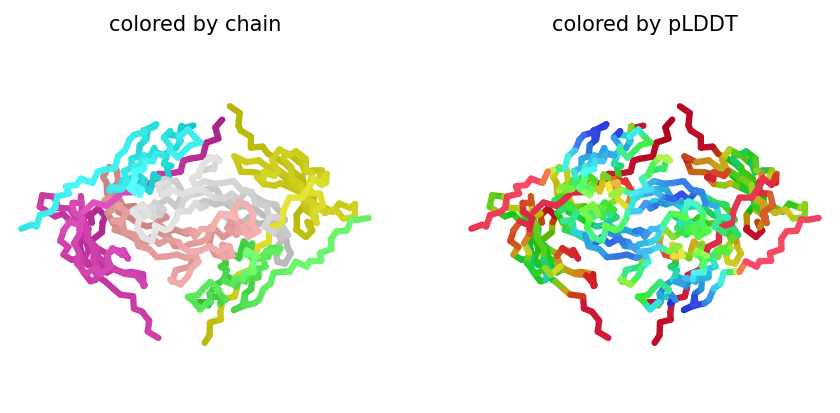

2024-11-06 21:42:49,506 alphafold2_multimer_v3_model_1_seed_013 recycle=0 pLDDT=67.5 pTM=0.763 ipTM=0.729
2024-11-06 21:42:49,507 alphafold2_multimer_v3_model_1_seed_013 took 11.1s (0 recycles)


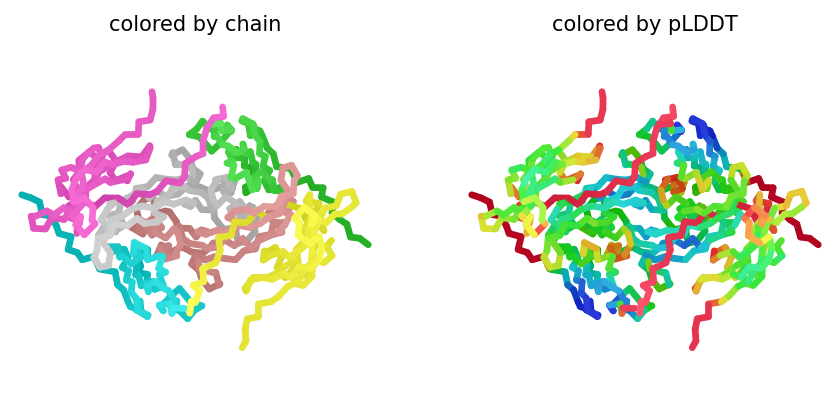

2024-11-06 21:43:01,404 alphafold2_multimer_v3_model_2_seed_013 recycle=0 pLDDT=69.5 pTM=0.655 ipTM=0.603
2024-11-06 21:43:01,406 alphafold2_multimer_v3_model_2_seed_013 took 11.1s (0 recycles)


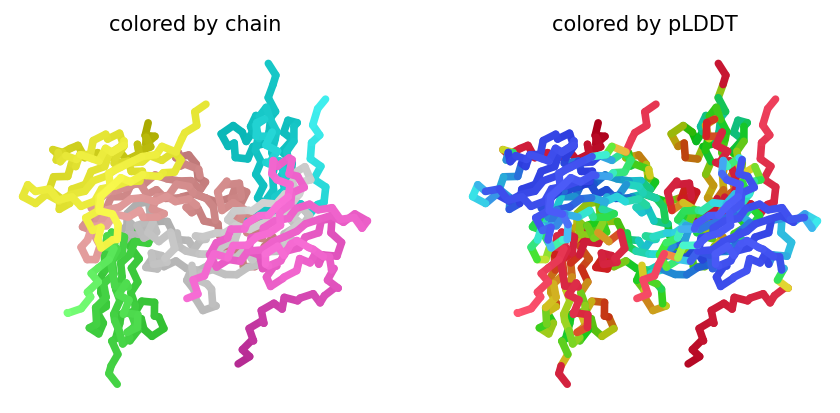

2024-11-06 21:43:13,237 alphafold2_multimer_v3_model_3_seed_013 recycle=0 pLDDT=64.2 pTM=0.695 ipTM=0.648
2024-11-06 21:43:13,239 alphafold2_multimer_v3_model_3_seed_013 took 11.0s (0 recycles)


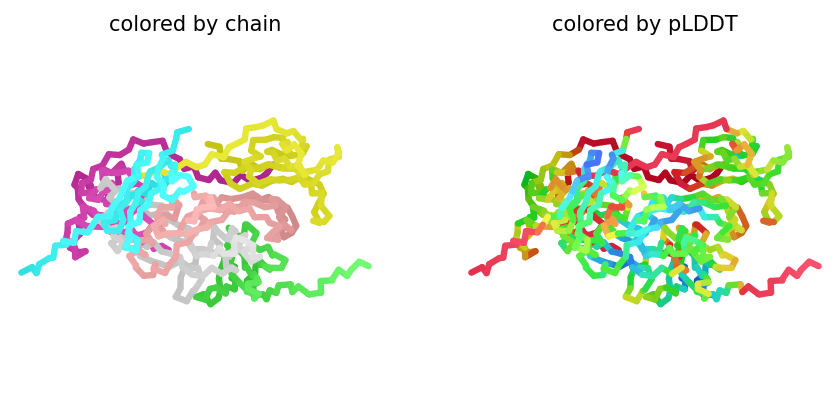

2024-11-06 21:43:25,086 alphafold2_multimer_v3_model_4_seed_013 recycle=0 pLDDT=77.4 pTM=0.74 ipTM=0.7
2024-11-06 21:43:25,088 alphafold2_multimer_v3_model_4_seed_013 took 11.1s (0 recycles)


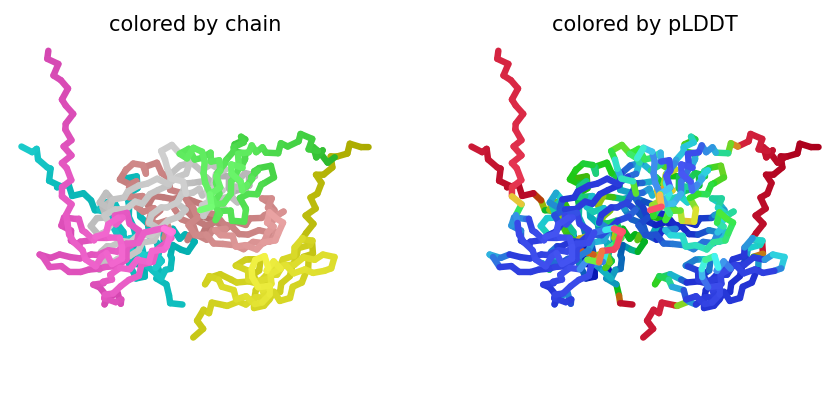

2024-11-06 21:43:36,927 alphafold2_multimer_v3_model_5_seed_013 recycle=0 pLDDT=66.5 pTM=0.766 ipTM=0.73
2024-11-06 21:43:36,929 alphafold2_multimer_v3_model_5_seed_013 took 11.1s (0 recycles)


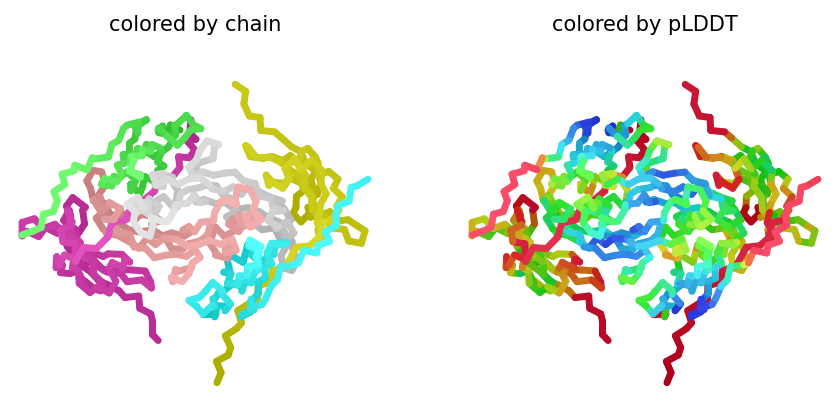

2024-11-06 21:43:48,825 alphafold2_multimer_v3_model_1_seed_014 recycle=0 pLDDT=80 pTM=0.801 ipTM=0.774
2024-11-06 21:43:48,827 alphafold2_multimer_v3_model_1_seed_014 took 11.1s (0 recycles)


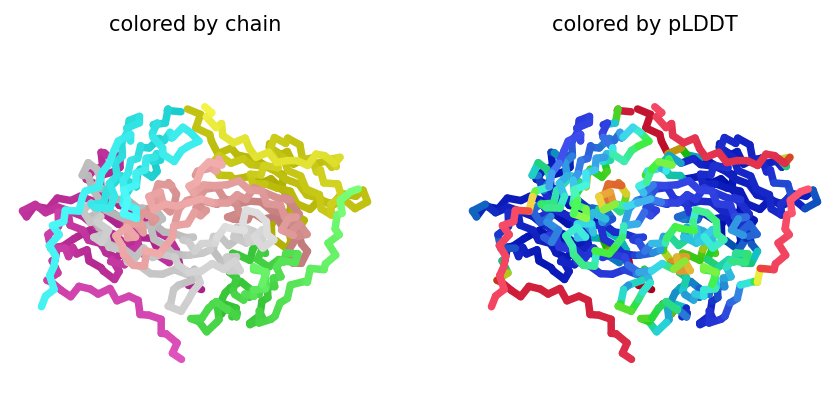

2024-11-06 21:44:00,677 alphafold2_multimer_v3_model_2_seed_014 recycle=0 pLDDT=69.6 pTM=0.742 ipTM=0.703
2024-11-06 21:44:00,679 alphafold2_multimer_v3_model_2_seed_014 took 11.1s (0 recycles)


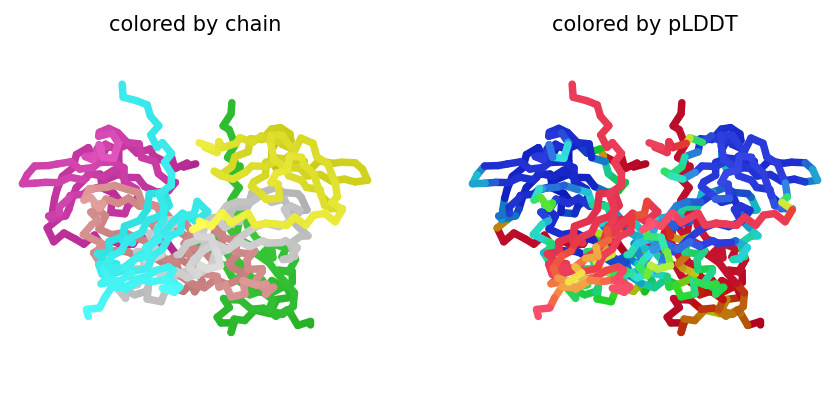

2024-11-06 21:44:12,512 alphafold2_multimer_v3_model_3_seed_014 recycle=0 pLDDT=60.9 pTM=0.588 ipTM=0.52
2024-11-06 21:44:12,513 alphafold2_multimer_v3_model_3_seed_014 took 11.1s (0 recycles)


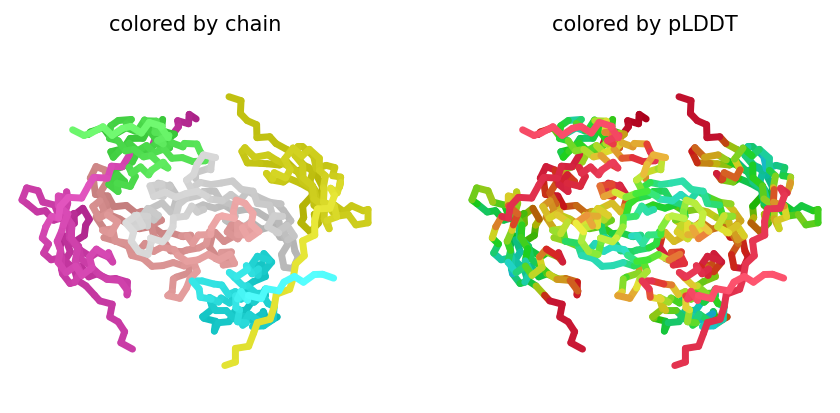

2024-11-06 21:44:24,370 alphafold2_multimer_v3_model_4_seed_014 recycle=0 pLDDT=78.6 pTM=0.763 ipTM=0.73
2024-11-06 21:44:24,373 alphafold2_multimer_v3_model_4_seed_014 took 11.1s (0 recycles)


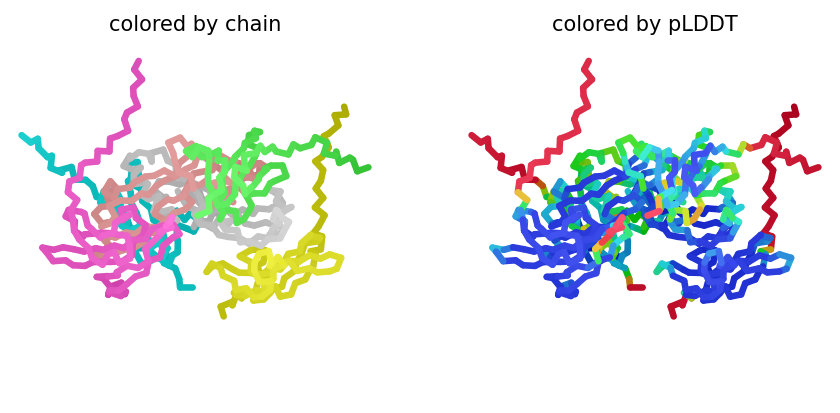

2024-11-06 21:44:36,224 alphafold2_multimer_v3_model_5_seed_014 recycle=0 pLDDT=67.7 pTM=0.706 ipTM=0.658
2024-11-06 21:44:36,226 alphafold2_multimer_v3_model_5_seed_014 took 11.1s (0 recycles)


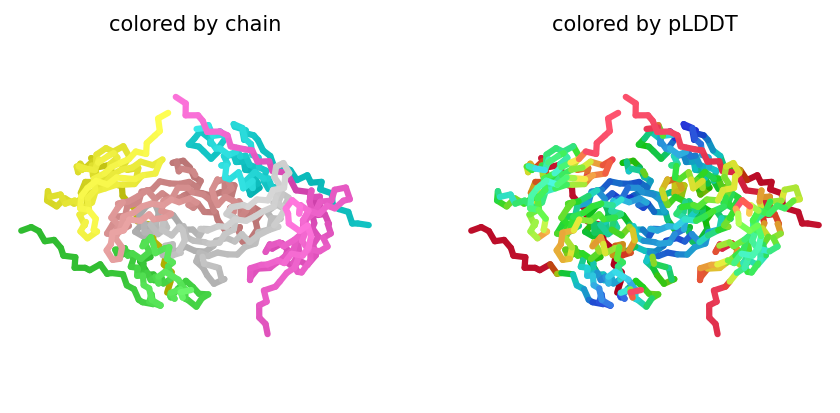

2024-11-06 21:44:48,098 alphafold2_multimer_v3_model_1_seed_015 recycle=0 pLDDT=72.5 pTM=0.76 ipTM=0.723
2024-11-06 21:44:48,099 alphafold2_multimer_v3_model_1_seed_015 took 11.1s (0 recycles)


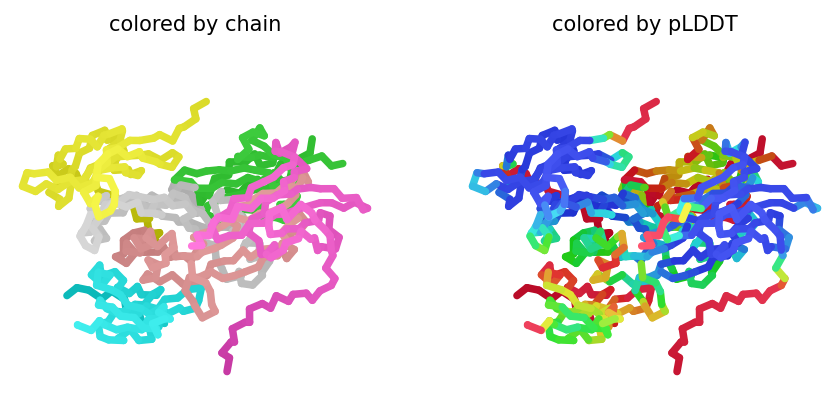

2024-11-06 21:44:59,974 alphafold2_multimer_v3_model_2_seed_015 recycle=0 pLDDT=69.8 pTM=0.72 ipTM=0.678
2024-11-06 21:44:59,976 alphafold2_multimer_v3_model_2_seed_015 took 11.1s (0 recycles)


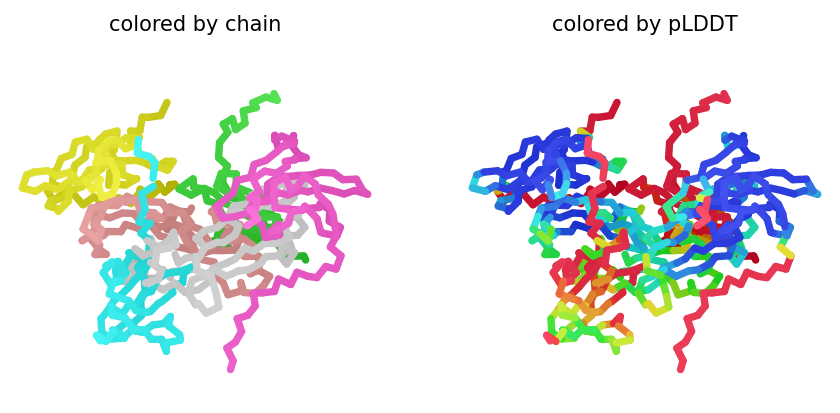

2024-11-06 21:45:11,814 alphafold2_multimer_v3_model_3_seed_015 recycle=0 pLDDT=60.7 pTM=0.644 ipTM=0.586
2024-11-06 21:45:11,815 alphafold2_multimer_v3_model_3_seed_015 took 11.1s (0 recycles)


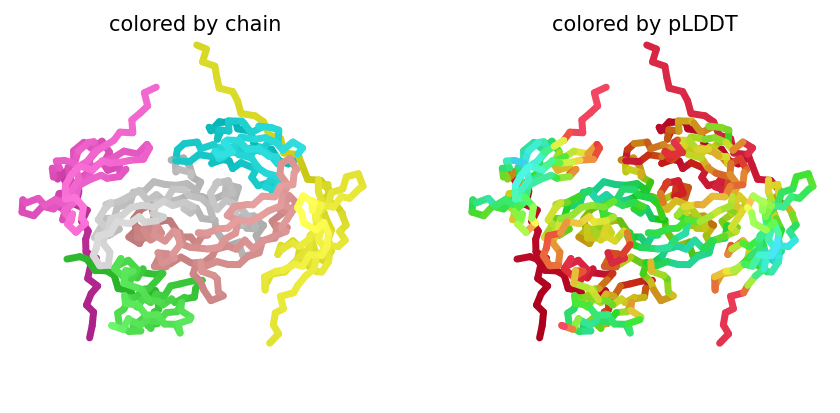

2024-11-06 21:45:23,667 alphafold2_multimer_v3_model_4_seed_015 recycle=0 pLDDT=72.4 pTM=0.702 ipTM=0.656
2024-11-06 21:45:23,668 alphafold2_multimer_v3_model_4_seed_015 took 11.1s (0 recycles)


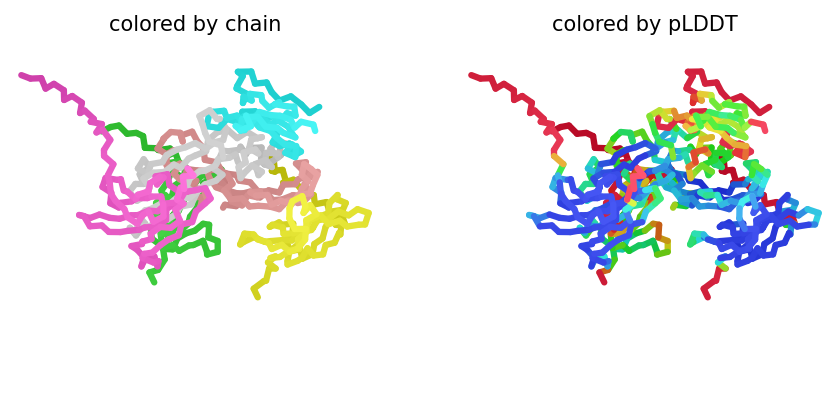

2024-11-06 21:45:35,521 alphafold2_multimer_v3_model_5_seed_015 recycle=0 pLDDT=78.2 pTM=0.78 ipTM=0.748
2024-11-06 21:45:35,522 alphafold2_multimer_v3_model_5_seed_015 took 11.1s (0 recycles)


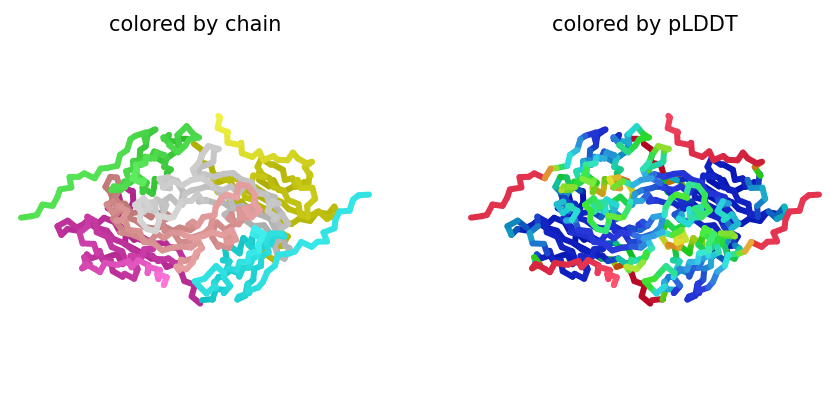

2024-11-06 21:45:36,290 reranking models by 'multimer' metric
2024-11-06 21:50:10,965 Relaxation took 274.7s
2024-11-06 21:50:10,966 rank_001_alphafold2_multimer_v3_model_1_seed_003 pLDDT=81.4 pTM=0.817 ipTM=0.791
2024-11-06 21:54:29,789 Relaxation took 258.8s
2024-11-06 21:54:29,790 rank_002_alphafold2_multimer_v3_model_1_seed_014 pLDDT=80 pTM=0.801 ipTM=0.774
2024-11-06 21:58:43,487 Relaxation took 253.7s
2024-11-06 21:58:43,488 rank_003_alphafold2_multimer_v3_model_1_seed_000 pLDDT=80 pTM=0.802 ipTM=0.773
2024-11-06 22:03:26,244 Relaxation took 282.8s
2024-11-06 22:03:26,245 rank_004_alphafold2_multimer_v3_model_1_seed_011 pLDDT=78.9 pTM=0.793 ipTM=0.764
2024-11-06 22:07:22,598 Relaxation took 236.4s
2024-11-06 22:07:22,600 rank_005_alphafold2_multimer_v3_model_4_seed_008 pLDDT=80.6 pTM=0.794 ipTM=0.763
2024-11-06 22:07:22,600 rank_006_alphafold2_multimer_v3_model_1_seed_012 pLDDT=79.2 pTM=0.792 ipTM=0.762
2024-11-06 22:07:22,601 rank_007_alphafold2_multimer_v3_model_1_seed_010 pLDD

0

In [13]:
#@title Run Prediction
display_images = True #@param {type:"boolean"}

import sys
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from Bio import BiopythonDeprecationWarning
warnings.simplefilter(action='ignore', category=BiopythonDeprecationWarning)
from pathlib import Path
from colabfold.download import download_alphafold_params, default_data_dir
from colabfold.utils import setup_logging
from colabfold.batch import get_queries, run, set_model_type
from colabfold.plot import plot_msa_v2

import os
import numpy as np
try:
  K80_chk = os.popen('nvidia-smi | grep "Tesla K80" | wc -l').read()
except:
  K80_chk = "0"
  pass
if "1" in K80_chk:
  print("WARNING: found GPU Tesla K80: limited to total length < 1000")
  if "TF_FORCE_UNIFIED_MEMORY" in os.environ:
    del os.environ["TF_FORCE_UNIFIED_MEMORY"]
  if "XLA_PYTHON_CLIENT_MEM_FRACTION" in os.environ:
    del os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"]

from colabfold.colabfold import plot_protein
from pathlib import Path
import matplotlib.pyplot as plt

# For some reason we need that to get pdbfixer to import
if use_amber and f"/usr/local/lib/python{python_version}/site-packages/" not in sys.path:
    sys.path.insert(0, f"/usr/local/lib/python{python_version}/site-packages/")

def input_features_callback(input_features):
  if display_images:
    plot_msa_v2(input_features)
    plt.show()
    plt.close()

def prediction_callback(protein_obj, length,
                        prediction_result, input_features, mode):
  model_name, relaxed = mode
  if not relaxed:
    if display_images:
      fig = plot_protein(protein_obj, Ls=length, dpi=150)
      plt.show()
      plt.close()

result_dir = jobname
log_filename = os.path.join(jobname,"log.txt")
setup_logging(Path(log_filename))

queries, is_complex = get_queries(queries_path)
model_type = set_model_type(is_complex, model_type)

if "multimer" in model_type and max_msa is not None:
  use_cluster_profile = False
else:
  use_cluster_profile = True

download_alphafold_params(model_type, Path("."))
results = run(
    queries=queries,
    result_dir=result_dir,
    use_templates=use_templates,
    custom_template_path=custom_template_path,
    num_relax=num_relax,
    msa_mode=msa_mode,
    model_type=model_type,
    num_models=5,
    num_recycles=num_recycles,
    relax_max_iterations=relax_max_iterations,
    recycle_early_stop_tolerance=recycle_early_stop_tolerance,
    num_seeds=num_seeds,
    use_dropout=use_dropout,
    model_order=[1,2,3,4,5],
    is_complex=is_complex,
    data_dir=Path("."),
    keep_existing_results=False,
    rank_by="auto",
    pair_mode=pair_mode,
    pairing_strategy=pairing_strategy,
    stop_at_score=float(100),
    prediction_callback=prediction_callback,
    dpi=dpi,
    zip_results=False,
    save_all=save_all,
    max_msa=max_msa,
    use_cluster_profile=use_cluster_profile,
    input_features_callback=input_features_callback,
    save_recycles=save_recycles,
    user_agent="colabfold/google-colab-main",
)
results_zip = f"{jobname}.result.zip"
os.system(f"zip -r {results_zip} {jobname}")

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

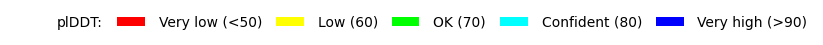

In [14]:
#@title Display 3D structure {run: "auto"}
import py3Dmol
import glob
import matplotlib.pyplot as plt
from colabfold.colabfold import plot_plddt_legend
from colabfold.colabfold import pymol_color_list, alphabet_list
rank_num = 1 #@param ["1", "2", "3", "4", "5"] {type:"raw"}
color = "lDDT" #@param ["chain", "lDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = False #@param {type:"boolean"}

tag = results["rank"][0][rank_num - 1]
jobname_prefix = ".custom" if msa_mode == "custom" else ""
pdb_filename = f"{jobname}/{jobname}{jobname_prefix}_unrelaxed_{tag}.pdb"
pdb_file = glob.glob(pdb_filename)

def show_pdb(rank_num=1, show_sidechains=False, show_mainchains=False, color="lDDT"):
  model_name = f"rank_{rank_num}"
  view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js',)
  view.addModel(open(pdb_file[0],'r').read(),'pdb')

  if color == "lDDT":
    view.setStyle({'cartoon': {'colorscheme': {'prop':'b','gradient': 'roygb','min':50,'max':90}}})
  elif color == "rainbow":
    view.setStyle({'cartoon': {'color':'spectrum'}})
  elif color == "chain":
    chains = len(queries[0][1]) + 1 if is_complex else 1
    for n,chain,color in zip(range(chains),alphabet_list,pymol_color_list):
       view.setStyle({'chain':chain},{'cartoon': {'color':color}})

  if show_sidechains:
    BB = ['C','O','N']
    view.addStyle({'and':[{'resn':["GLY","PRO"],'invert':True},{'atom':BB,'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"GLY"},{'atom':'CA'}]},
                        {'sphere':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"PRO"},{'atom':['C','O'],'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
  if show_mainchains:
    BB = ['C','O','N','CA']
    view.addStyle({'atom':BB},{'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})

  view.zoomTo()
  return view

show_pdb(rank_num, show_sidechains, show_mainchains, color).show()
if color == "lDDT":
  plot_plddt_legend().show()


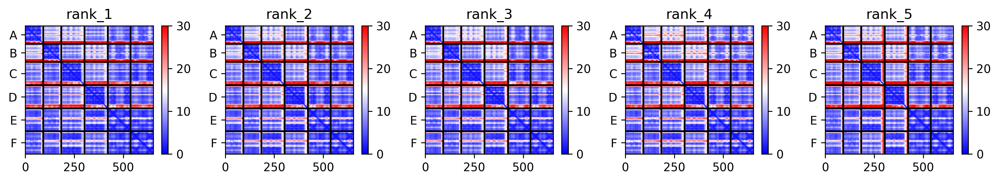
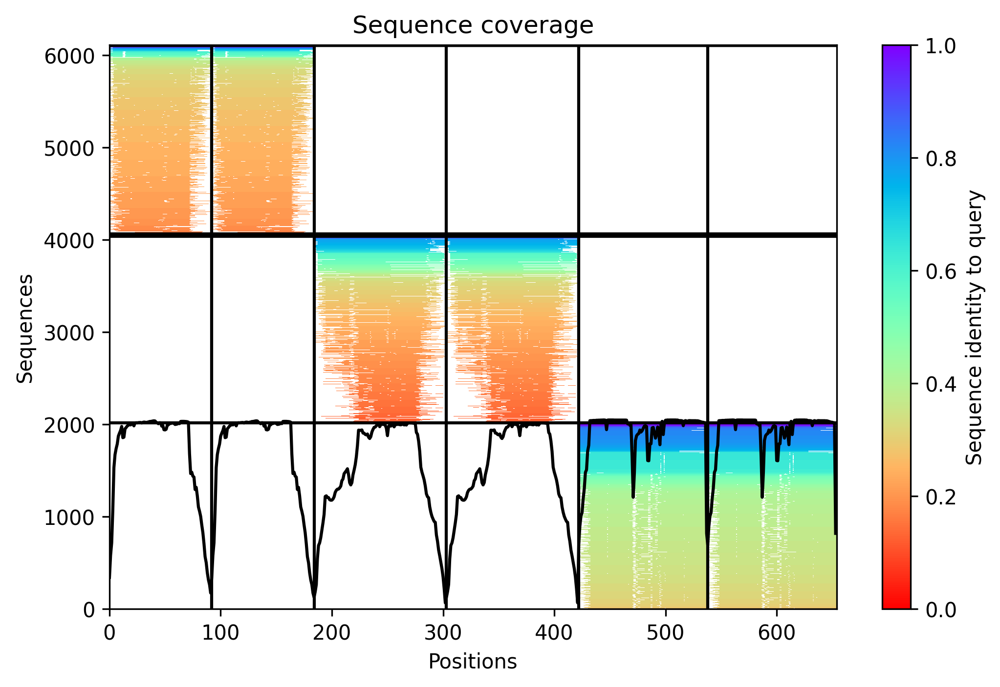
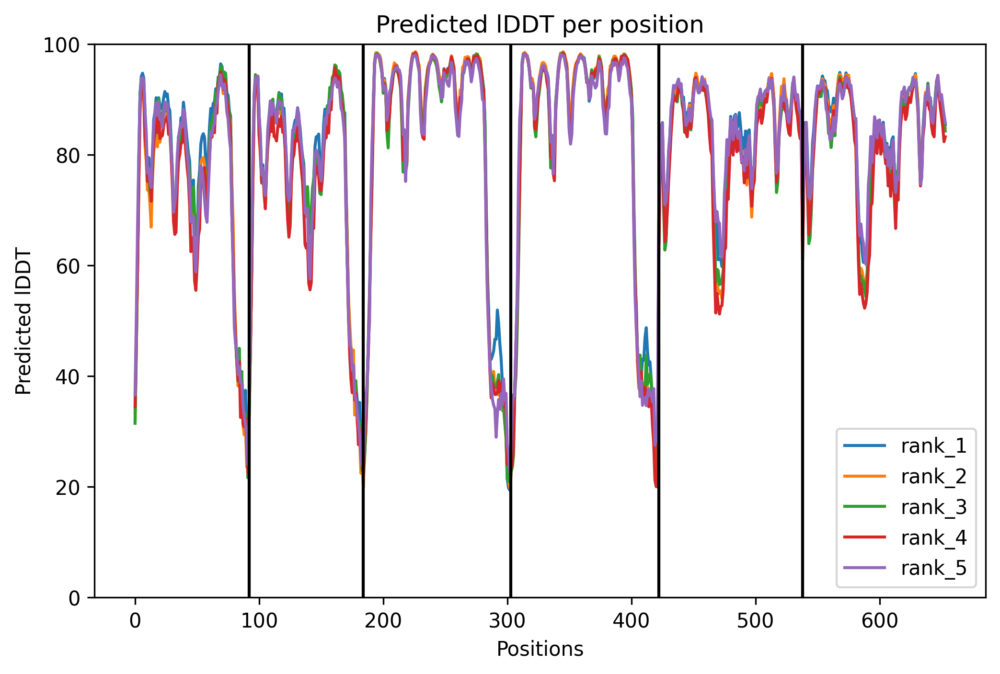

In [15]:
#@title Plots {run: "auto"}
from IPython.display import display, HTML
import base64
from html import escape

# see: https://stackoverflow.com/a/53688522
def image_to_data_url(filename):
  ext = filename.split('.')[-1]
  prefix = f'data:image/{ext};base64,'
  with open(filename, 'rb') as f:
    img = f.read()
  return prefix + base64.b64encode(img).decode('utf-8')

pae = ""
pae_file = os.path.join(jobname,f"{jobname}{jobname_prefix}_pae.png")
if os.path.isfile(pae_file):
    pae = image_to_data_url(pae_file)
cov = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_coverage.png"))
plddt = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_plddt.png"))
display(HTML(f"""
<style>
  img {{
    float:left;
  }}
  .full {{
    max-width:100%;
  }}
  .half {{
    max-width:50%;
  }}
  @media (max-width:640px) {{
    .half {{
      max-width:100%;
    }}
  }}
</style>
<div style="max-width:90%; padding:2em;">
  <h1>Plots for {escape(jobname)}</h1>
  { '<!--' if pae == '' else '' }<img src="{pae}" class="full" />{ '-->' if pae == '' else '' }
  <img src="{cov}" class="half" />
  <img src="{plddt}" class="half" />
</div>
"""))

In [16]:
#@title Package and download results
#@markdown If you are having issues downloading the result archive, try disabling your adblocker and run this cell again. If that fails click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

if msa_mode == "custom":
  print("Don't forget to cite your custom MSA generation method.")

files.download(f"{jobname}.result.zip")

if save_to_google_drive == True and drive:
  uploaded = drive.CreateFile({'title': f"{jobname}.result.zip"})
  uploaded.SetContentFile(f"{jobname}.result.zip")
  uploaded.Upload()
  print(f"Uploaded {jobname}.result.zip to Google Drive with ID {uploaded.get('id')}")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uploaded ECD_w_Activin_449f5_0.result.zip to Google Drive with ID 1JpMZ6hc2gy7h0Y9mgqdZT5HkGQT-hd22


# Instructions <a name="Instructions"></a>
For detailed instructions, tips and tricks, see recently published paper at [Nature Protocols](https://www.nature.com/articles/s41596-024-01060-5)

**Quick start**
1. Paste your protein sequence(s) in the input field.
2. Press "Runtime" -> "Run all".
3. The pipeline consists of 5 steps. The currently running step is indicated by a circle with a stop sign next to it.

**Result zip file contents**

1. PDB formatted structures sorted by avg. pLDDT and complexes are sorted by pTMscore. (unrelaxed and relaxed if `use_amber` is enabled).
2. Plots of the model quality.
3. Plots of the MSA coverage.
4. Parameter log file.
5. A3M formatted input MSA.
6. A `predicted_aligned_error_v1.json` using [AlphaFold-DB's format](https://alphafold.ebi.ac.uk/faq#faq-7) and a `scores.json` for each model which contains an array (list of lists) for PAE, a list with the average pLDDT and the pTMscore.
7. BibTeX file with citations for all used tools and databases.

At the end of the job a download modal box will pop up with a `jobname.result.zip` file. Additionally, if the `save_to_google_drive` option was selected, the `jobname.result.zip` will be uploaded to your Google Drive.

**MSA generation for complexes**

For the complex prediction we use unpaired and paired MSAs. Unpaired MSA is generated the same way as for the protein structures prediction by searching the UniRef100 and environmental sequences three iterations each.

The paired MSA is generated by searching the UniRef100 database and pairing the best hits sharing the same NCBI taxonomic identifier (=species or sub-species). We only pair sequences if all of the query sequences are present for the respective taxonomic identifier.

**Using a custom MSA as input**

To predict the structure with a custom MSA (A3M formatted): (1) Change the `msa_mode`: to "custom", (2) Wait for an upload box to appear at the end of the "MSA options ..." box. Upload your A3M. The first fasta entry of the A3M must be the query sequence without gaps.

It is also possilbe to proide custom MSAs for complex predictions. Read more about the format [here](https://github.com/sokrypton/ColabFold/issues/76).

As an alternative for MSA generation the [HHblits Toolkit server](https://toolkit.tuebingen.mpg.de/tools/hhblits) can be used. After submitting your query, click "Query Template MSA" -> "Download Full A3M". Download the A3M file and upload it in this notebook.

**PDB100** <a name="pdb100"></a>

As of 23/06/08, we have transitioned from using the PDB70 to a 100% clustered PDB, the PDB100. The construction methodology of PDB100 differs from that of PDB70.

The PDB70 was constructed by running each PDB70 representative sequence through [HHblits](https://github.com/soedinglab/hh-suite) against the [Uniclust30](https://uniclust.mmseqs.com/). On the other hand, the PDB100 is built by searching each PDB100 representative structure with [Foldseek](https://github.com/steineggerlab/foldseek) against the [AlphaFold Database](https://alphafold.ebi.ac.uk).

To maintain compatibility with older Notebook versions and local installations, the generated files and API responses will continue to be named "PDB70", even though we're now using the PDB100.

**Using custom templates** <a name="custom_templates"></a>

To predict the structure with a custom template (PDB or mmCIF formatted): (1) change the `template_mode` to "custom" in the execute cell and (2) wait for an upload box to appear at the end of the "Input Protein" box. Select and upload your templates (multiple choices are possible).

* Templates must follow the four letter PDB naming with lower case letters.

* Templates in mmCIF format must contain `_entity_poly_seq`. An error is thrown if this field is not present. The field `_pdbx_audit_revision_history.revision_date` is automatically generated if it is not present.

* Templates in PDB format are automatically converted to the mmCIF format. `_entity_poly_seq` and `_pdbx_audit_revision_history.revision_date` are automatically generated.

If you encounter problems, please report them to this [issue](https://github.com/sokrypton/ColabFold/issues/177).

**Comparison to the full AlphaFold2 and AlphaFold2 Colab**

This notebook replaces the homology detection and MSA pairing of AlphaFold2 with MMseqs2. For a comparison against the [AlphaFold2 Colab](https://colab.research.google.com/github/deepmind/alphafold/blob/main/notebooks/AlphaFold.ipynb) and the full [AlphaFold2](https://github.com/deepmind/alphafold) system read our [paper](https://www.nature.com/articles/s41592-022-01488-1).

**Troubleshooting**
* Check that the runtime type is set to GPU at "Runtime" -> "Change runtime type".
* Try to restart the session "Runtime" -> "Factory reset runtime".
* Check your input sequence.

**Known issues**
* Google Colab assigns different types of GPUs with varying amount of memory. Some might not have enough memory to predict the structure for a long sequence.
* Your browser can block the pop-up for downloading the result file. You can choose the `save_to_google_drive` option to upload to Google Drive instead or manually download the result file: Click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

**Limitations**
* Computing resources: Our MMseqs2 API can handle ~20-50k requests per day.
* MSAs: MMseqs2 is very precise and sensitive but might find less hits compared to HHblits/HMMer searched against BFD or MGnify.
* We recommend to additionally use the full [AlphaFold2 pipeline](https://github.com/deepmind/alphafold).

**Description of the plots**
*   **Number of sequences per position** - We want to see at least 30 sequences per position, for best performance, ideally 100 sequences.
*   **Predicted lDDT per position** - model confidence (out of 100) at each position. The higher the better.
*   **Predicted Alignment Error** - For homooligomers, this could be a useful metric to assess how confident the model is about the interface. The lower the better.

**Bugs**
- If you encounter any bugs, please report the issue to https://github.com/sokrypton/ColabFold/issues

**License**

The source code of ColabFold is licensed under [MIT](https://raw.githubusercontent.com/sokrypton/ColabFold/main/LICENSE). Additionally, this notebook uses the AlphaFold2 source code and its parameters licensed under [Apache 2.0](https://raw.githubusercontent.com/deepmind/alphafold/main/LICENSE) and [CC BY 4.0](https://creativecommons.org/licenses/by-sa/4.0/) respectively. Read more about the AlphaFold license [here](https://github.com/deepmind/alphafold).

**Acknowledgments**
- We thank the AlphaFold team for developing an excellent model and open sourcing the software.

- [KOBIC](https://kobic.re.kr) and [Söding Lab](https://www.mpinat.mpg.de/soeding) for providing the computational resources for the MMseqs2 MSA server.

- Richard Evans for helping to benchmark the ColabFold's Alphafold-multimer support.

- [David Koes](https://github.com/dkoes) for his awesome [py3Dmol](https://3dmol.csb.pitt.edu/) plugin, without whom these notebooks would be quite boring!

- Do-Yoon Kim for creating the ColabFold logo.

- A colab by Sergey Ovchinnikov ([@sokrypton](https://twitter.com/sokrypton)), Milot Mirdita ([@milot_mirdita](https://twitter.com/milot_mirdita)) and Martin Steinegger ([@thesteinegger](https://twitter.com/thesteinegger)).
